# Relation between params

In [1]:
import numpy as np

def compute_tangents(points):
    tangents = []
    n = len(points)

    for i in range(n):
        if i == 0:
            dx, dy = points[i + 1][0] - points[i][0], points[i + 1][1] - points[i][1]
        elif i == n - 1:
            dx, dy = points[i][0] - points[i - 1][0], points[i][1] - points[i - 1][1]
        else:
            dx, dy = points[i + 1][0] - points[i - 1][0], points[i + 1][1] - points[i - 1][1]

        scale = 1
        p1 = (points[i][0] - scale * dx, points[i][1] - scale * dy)
        p2 = (points[i][0] + scale * dx, points[i][1] + scale * dy)

        tangents.append((p1, p2))

    return tangents

def process_exist_path(path):
    """
    Process an existing path consisting of a series of points and compute
    tangent vectors at each point along the path.

    Args:
        path: A list or numpy array of [x,y] coordinates that form a path

    Returns:
        param: Dictionary containing the original path and computed tangent vectors
    """
    path = np.array(path)
    param = {
        "path": path,
        "start_x": path[0][0],
        "start_y": path[0][1],
        "end_x": path[-1][0],
        "end_y": path[-1][1],
        "tangent": compute_tangents(path),
    }

    return param

with open("../data/paths/driving_path_left2right.txt", "r") as f:
    data_left2right = f.readlines()
    data_left2right = [line.strip().split(",") for line in data_left2right]
    data_left2right = [[float(val) for val in line] for line in data_left2right]
    data_left2right = np.array(data_left2right)
    
with open("../data/paths/hitachi.txt", "r") as f:
    data_hitachi = f.readlines()
    data_hitachi = [line.strip().split(",") for line in data_hitachi]
    data_hitachi = [[float(val) for val in line] for line in data_hitachi]
    data_hitachi = np.array(data_hitachi)



predefined_path = {
    "1": {
        "P_0": [-2.376371583333333, -13.749357381666668],
        "P_d": [-0.566469992644628, -27.297582133636364],
        "P_f": [-7.7486732, -21.271947543333333],
        "yaw_0": 90 - (-88.97628786666667),
        "yaw_d": 90 - (-62.168829599999995),
        "yaw_f": 90 - (-1.9554259149999922),
        "forward paths": process_exist_path(data_left2right[:40]),
        "backward paths": process_exist_path(data_left2right[40:]),
    },
    "2": {
        "P_0": [],
        "P_d": [1.035116, -18.325821],
        "P_f": [-7.685114, -21.214608],
        "yaw_0": None,
        "yaw_d": 90 - (50),
        "yaw_f": 90 - (0),
        "forward paths": [],
        "backward paths": process_exist_path(data_hitachi),
    },
}
# predefined_path["1"]["forward paths"]

## Haptic shared control

In [12]:
import pandas as pd
#cspell: ignore logi
recorded_time = "2025-03-25_13-31-50"
sensor_df = pd.read_csv(f"./logs/carla_sensor_log_{recorded_time}.csv")
haptic_df = pd.read_csv(f"./logs/haptic_shared_control_log_{recorded_time}.csv")
logiSW_df = pd.read_csv(f"./logs/steering_wheel_log_{recorded_time}.csv")

data = pd.DataFrame()
data["Time (t)"] = haptic_df["Time (t)"] - haptic_df["Time (t)"][0]
data["[Carla] Throttle"] = sensor_df["throttle_input"]
data["[Input] Throttle"] = logiSW_df[" Acceleration Pedal"]
data["[Carla] Steering Input"] = sensor_df["steering_input"]
data["[Input] Steering Input"] = logiSW_df[" Steering Wheel Angle"]
data["[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg)"] = haptic_df["[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg)"]

data["[Measured] Current Position ~ X(t) (m)"] = haptic_df["[Measured] Current Position ~ X(t) (m)"]
data["[Measured] Current Position ~ Y(t) (m)"] = haptic_df["[Measured] Current Position ~ Y(t) (m)"]
data["[Measured] Current Yaw Angle ~ Phi(t) (deg)"] = haptic_df["[Measured] Current Yaw Angle ~ Phi(t) (deg)"]
data["[Measured] Speed ~ V(t) (m/s)"] = haptic_df["[Measured] Speed ~ V(t) (m/s)"]

data["[Measured] VelocityX ~ Vx(t) (m/s)"] = sensor_df["Velocity_0"]
data["[Measured] VelocityY ~ Vy(t) (m/s)"] = sensor_df["Velocity_1"]
data["[Measured] AccelerationX ~ Ax(t) (m/s^2)"] = sensor_df["Acceleration_0"]
data["[Measured] AccelerationY ~ Ay(t) (m/s^2)"] = sensor_df["Acceleration_1"]
data["[Measured] Angular VelocityZ ~ Phi_dot(t) (deg/s)"] = sensor_df["AngularVelocity_2"]

data["[Measured] Steering Angle FL ~ delta_fl(t) (deg)"] = haptic_df["[Measured] Steering Angle FL ~ delta_fl(t) (deg)"]
data["[Measured] Steering Angle FR ~ delta_fr(t) (deg)"] = haptic_df["[Measured] Steering Angle FR ~ delta_fr(t) (deg)"]

data["[Computed] Rotation direction ~ rotate(t) (CW/CCW)"] = haptic_df["[Computed] Rotation direction ~ rotate(t) (CW/CCW)"]
data["[Computed] Turning Radius ~ R(delta) (m)"] = haptic_df["[Computed] Turning Radius ~ R(delta) (m)"]
data["[Computed] Vehicle Steering Angle ~ Delta_v(t) (deg)"] = haptic_df["[Computed] Vehicle Steering Angle ~ Delta_v(t) (deg)"]
data["[Computed] Center of Rotation to WORLD ~ X_c(t) (m)"] = haptic_df["[Computed] Center of Rotation to WORLD ~ X_c(t) (m)"]
data["[Computed] Center of Rotation to WORLD ~ Y_c(t) (m)"] = haptic_df["[Computed] Center of Rotation to WORLD ~ Y_c(t) (m)"]

data["[Computed] Current Error to Trajectory ~ e(t) (m)"] = haptic_df["[Computed] Current Error to Trajectory ~ e(t) (m)"]
data["[Computed] Predicted Error to Trajectory ~ eps_tp(t) (m)"] = haptic_df["[Computed] Predicted Error to Trajectory ~ eps_tp(t) (m)"]

data["[Computed] Predicted Position ~ X_tp(t) (m)"] = haptic_df["[Computed] Predicted Position ~ X_tp(t) (m)"]
data["[Computed] Predicted Position ~ Y_tp(t) (m)"] = haptic_df["[Computed] Predicted Position ~ Y_tp(t) (m)"]
data["[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)"] = haptic_df["[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)"]
data["[Computed] Change of Yaw Angle ~ Delta_Phi(t) (deg)"] = haptic_df["[Computed] Change of Yaw Angle ~ Delta_Phi(t) (deg)"]

data["[Computed] Desired Steering Wheel Angle ~ Theta_d(t) (deg)"] = haptic_df["[Computed] Desired Steering Wheel Angle ~ Theta_d(t) (deg)"]
data["[Computed] Torque applied ~ Tau_das (N.m)"] = haptic_df["[Computed] Torque applied ~ Tau_das (N.m)"]

data.to_excel(f"../data/path_logs/data_{recorded_time}.xlsx", index=False)
data.head()

,Time (t),[Carla] Throttle,[Input] Throttle,[Carla] Steering Input,[Input] Steering Input,[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg),[Measured] Current Position ~ X(t) (m),[Measured] Current Position ~ Y(t) (m),[Measured] Current Yaw Angle ~ Phi(t) (deg),[Measured] Speed ~ V(t) (m/s),...,[Computed] Center of Rotation to WORLD ~ X_c(t) (m),[Computed] Center of Rotation to WORLD ~ Y_c(t) (m),[Computed] Current Error to Trajectory ~ e(t) (m),[Computed] Predicted Error to Trajectory ~ eps_tp(t) (m),[Computed] Predicted Position ~ X_tp(t) (m),[Computed] Predicted Position ~ Y_tp(t) (m),[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg),[Computed] Change of Yaw Angle ~ Delta_Phi(t) (deg),[Computed] Desired Steering Wheel Angle ~ Theta_d(t) (deg),[Computed] Torque applied ~ Tau_das (N.m)
0,0.000000,0.0,0.5,-0.000092,0.0,0.0,1.036083,-18.329962,49.97036,0.000005,...,-inf,inf,0.003918,inf,-inf,inf,49.970451,0.000092,inf,inf
1,0.057323,0.0,0.5,-0.000092,0.0,0.0,1.036083,-18.329962,49.97036,0.000003,...,-inf,inf,0.003918,inf,-inf,inf,49.970451,0.000092,inf,inf
2,0.117902,0.0,0.5,-0.000092,0.0,0.0,1.036083,-18.329962,49.97036,0.000003,...,-inf,inf,0.003918,inf,-inf,inf,49.970451,0.000092,inf,inf
3,0.165851,0.0,0.5,-0.000092,0.0,0.0,1.036083,-18.329962,49.97036,0.000006,...,-inf,inf,0.003918,inf,-inf,inf,49.970451,0.000092,inf,inf
4,0.242291,0.0,0.5,-0.000092,0.0,0.0,1.036083,-18.329962,49.97036,0.000004,...,-inf,inf,0.003918,inf,-inf,inf,49.970451,0.000092,inf,inf


In [14]:
# data.columns

In [14]:
# compared paths
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
plt.style.use('default')

def plot_trajectories(df, desired_trajectory, output_file='plots/trajectory_comparison.pdf', start_time=0):
    # Set up plot style
    plt.style.use('default')
    plt.rcParams.update({'font.size': 12})
    
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    time_column = 'Normalized Time'
    
    # Create a 2D visualization of measured vs predicted positions (unchanged)
    plt.figure()
    
    # Select a subset of points for better visualization (every Nth point)
    skip = max(1, len(df) // 50)  # Show about 50 points
    subset = df.iloc[::skip].copy()
    
    plt.plot(subset['[Measured] Current Position ~ Y(t) (m)'], 
             subset['[Measured] Current Position ~ X(t) (m)'], 
             'bo-', linewidth=1.5, markersize=4, label='Measured Path')
    plt.plot(subset['[Computed] Predicted Position ~ Y_tp(t) (m)'], 
             subset['[Computed] Predicted Position ~ X_tp(t) (m)'], 
             'r.--', linewidth=1.5, markersize=4, label='Predicted Path')
    plt.plot(desired_trajectory[:, 1],
             desired_trajectory[:, 0], 
             'g-', linewidth=2, label='Desired Path')
    
    # Connect measured and predicted points with thin lines
    for i in range(len(subset)):
        plt.plot([subset['[Measured] Current Position ~ Y(t) (m)'].iloc[i], 
                  subset['[Computed] Predicted Position ~ Y_tp(t) (m)'].iloc[i]],
                 [subset['[Measured] Current Position ~ X(t) (m)'].iloc[i], 
                  subset['[Computed] Predicted Position ~ X_tp(t) (m)'].iloc[i]],
                 'k--', linewidth=0.5, alpha=0.3)
    
    # Add arrows to show direction of travel
    for i in range(0, len(subset), 10):
        # Measured direction arrow
        plt.arrow(subset['[Measured] Current Position ~ Y(t) (m)'].iloc[i], 
                 subset['[Measured] Current Position ~ X(t) (m)'].iloc[i],
                 0.3*np.sin(np.radians(subset['[Measured] Current Yaw Angle ~ Phi(t) (deg)'].iloc[i])),
                 0.3*np.cos(np.radians(subset['[Measured] Current Yaw Angle ~ Phi(t) (deg)'].iloc[i])),
                 head_width=0.1, head_length=0.2, fc='blue', ec='blue')
        
        # Predicted direction arrow
        plt.arrow(subset['[Computed] Predicted Position ~ Y_tp(t) (m)'].iloc[i], 
                 subset['[Computed] Predicted Position ~ X_tp(t) (m)'].iloc[i],
                 0.3*np.sin(np.radians(subset['[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)'].iloc[i])),
                 0.3*np.cos(np.radians(subset['[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)'].iloc[i])),
                 head_width=0.1, head_length=0.2, fc='red', ec='red')
    plt.axis('equal')

    # plt.ylim(-8,2)
    # plt.xlim(-22.5,-17.5)
    
    plt.grid(visible=True, which='both', alpha=0.3)
    plt.xlabel('Y Position (m)', fontsize=14)
    plt.ylabel('X Position (m)', fontsize=14)
    
    plt.title('2D Visualization of Measured vs Predicted Positions', fontsize=16)
    
    plt.legend(loc='best')
    
    plt.savefig(f"{output_file}_2D_path.pdf", format='pdf', bbox_inches='tight')
    plt.savefig(f"{output_file}_2D_path.png", format='png', dpi=300, bbox_inches='tight')
    print(f"2D path plot saved as {output_file}_2D_path.pdf and {output_file}_2D_path.png")
    


2D path plot saved as plots/2025-03-25_04-23-51/trajectory_comparison_2D_path.pdf and plots/2025-03-25_04-23-51/trajectory_comparison_2D_path.png


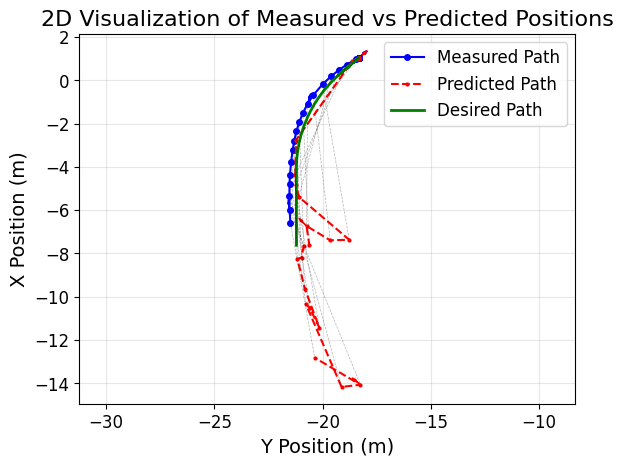

In [5]:
import os
df = pd.read_excel(f"../data/path_logs/data_{recorded_time}.xlsx")
os.makedirs(f'plots/{recorded_time}', exist_ok=True)
plot_trajectories(df, predefined_path["2"]["backward paths"]["path"], output_file=f'plots/{recorded_time}/trajectory_comparison', start_time=0)

Plot saved as plots/2025-03-24_14-28-22/steering_analysis
Plot saved as plots/2025-03-24_14-28-22/steering_analysis.pdf


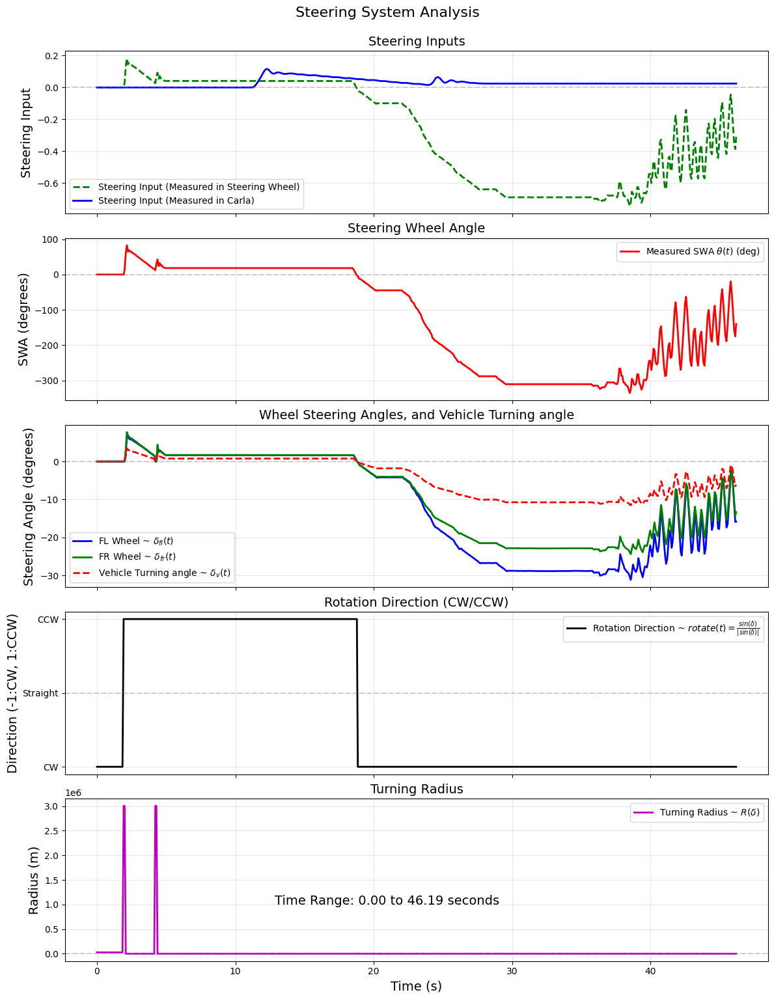

Zoomed turning radius plot saved as turning_radius_zoomed.png


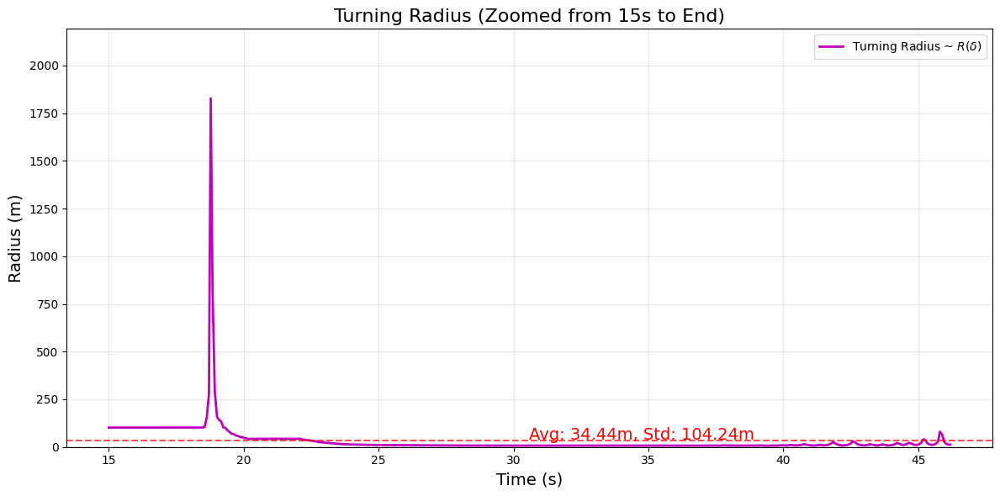

In [72]:
# Steering input
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
plt.rcParams['text.usetex'] = True

def plot_steering_related_parameters(df, output_file='plots/steering_analysis.png'):
    """
    Create a multi-panel figure with steering-related parameters sharing a time axis.
    
    Parameters:
        df (DataFrame): The dataframe containing the steering data
        output_file (str): Path to save the output plot
    """
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    time_column = 'Normalized Time'
    time_label = 'Time (s)'
    
    # Define parameters to plot in each panel
    panel_params = [
        {
            'title': 'Steering Inputs',
            'params': ['[Input] Steering Input', '[Carla] Steering Input'],
            'ylabel': 'Steering Input',
            'colors': ['g--', 'b'],
            'labels': ['Steering Input (Measured in Steering Wheel)', 'Steering Input (Measured in Carla)']
        },
        {
            'title': 'Steering Wheel Angle',
            'params': ['[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg)'],
            'ylabel': 'SWA (degrees)',
            'colors': ['r-'],
            'labels': [r'Measured SWA $\theta(t)$ (deg)']
        },
        {
            'title': 'Wheel Steering Angles, and Vehicle Turning angle',
            'params': [
                '[Measured] Steering Angle FL ~ delta_fl(t) (deg)', 
                '[Measured] Steering Angle FR ~ delta_fr(t) (deg)', 
                '[Computed] Vehicle Steering Angle ~ Delta_v(t) (deg)'
            ],
            'ylabel': 'Steering Angle (degrees)',
            'colors': ['b-', 'g-', 'r--'],
            'labels': [r'FL Wheel ~ $\delta_{fl}(t)$', r'FR Wheel ~ $\delta_{fr}(t)$', r'Vehicle Turning angle ~ $\delta_{v}(t)$']
        },
        {
            'title': 'Rotation Direction (CW/CCW)',
            'params': ['[Computed] Rotation direction ~ rotate(t) (CW/CCW)'],
            'ylabel': 'Direction (-1:CW, 1:CCW)',
            'colors': ['k-'],
            'labels': [r'Rotation Direction ~ $rotate(t) = \frac{sin(\delta)}{|sin(\delta)|}$']
        },
        {
            'title': 'Turning Radius',
            'params': ['[Computed] Turning Radius ~ R(delta) (m)'],
            'ylabel': 'Radius (m)',
            'colors': ['m-'],
            'labels': [r'Turning Radius ~ $R(\delta)$']
        }
    ]
    
    # Create the figure with subplots
    plt.style.use('default')
    fig, axes = plt.subplots(len(panel_params), 1, figsize=(12, 15), sharex=True)
    
    # Plot each panel
    for i, panel in enumerate(panel_params):
        ax = axes[i]
        
        for j, param in enumerate(panel['params']):
            if param in df.columns:
                ax.plot(df[time_column], df[param], panel['colors'][j], 
                       linewidth=2, label=panel['labels'][j])
        
        # Add horizontal line at y=0 for reference
        ax.axhline(y=0, color='gray', linestyle='--', alpha=0.3)
        
        # Set titles and labels
        ax.set_title(panel['title'], fontsize=14)
        ax.set_ylabel(panel['ylabel'], fontsize=14)
        ax.grid(True, alpha=0.3)
        ax.legend(loc='best')
        
        # Special case for rotation direction plot
        if 'Rotation Direction' in panel['title']:
            ax.set_yticks([-1, 0, 1])
            ax.set_yticklabels(['CW', 'Straight', 'CCW'])
        
    # Set x-label only for the bottom subplot
    axes[-1].set_xlabel(time_label, fontsize=14)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.15)  # Reduce the space between plots
    
    # Add a super title
    fig.suptitle('Steering System Analysis', fontsize=16, y=1.02)
    
    # Add timestamp range to plot
    time_range = f"Time Range: {df[time_col].iloc[0]:.2f} to {df[time_col].iloc[-1]:.2f} seconds"
    fig.text(0.5, 0.1, time_range, ha='center', fontsize=14)
    
    # Save the figure
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    print(f"Plot saved as {output_file}")
    pdf_file = f"{output_file}.pdf"
    plt.savefig(pdf_file, format='pdf', bbox_inches='tight')
    print(f"Plot saved as {pdf_file}")
    
    # Show the plot
    plt.show()

    # At the end of your function, add this code to create the zoomed radius plot
    if True:
        # Create a zoomed-in plot of the turning radius from 10s to the end
        plt.figure(figsize=(12, 6))
        
        # Normalize time to start from 0
        df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
        
        # Filter data from 10 seconds onwards
        zoom_df = df[df['Normalized Time'] >= 15]
        
        if len(zoom_df) > 0:
            plt.plot(zoom_df['Normalized Time'], zoom_df['[Computed] Turning Radius ~ R(delta) (m)'], 
                    'm-', linewidth=2, label=r'Turning Radius ~ $R(\delta)$')
            
            # Add horizontal line at y=0 for reference
            plt.axhline(y=0, color='gray', linestyle='--', alpha=0.3)
            
            # Calculate and display average turning radius for this period
            avg_radius = zoom_df['[Computed] Turning Radius ~ R(delta) (m)'].mean()
            std_radius = zoom_df['[Computed] Turning Radius ~ R(delta) (m)'].std()
            
            plt.axhline(y=avg_radius, color='r', linestyle='--', alpha=0.7)
            plt.text(zoom_df['Normalized Time'].iloc[len(zoom_df)//2], avg_radius*1.1, 
                    f'Avg: {avg_radius:.2f}m, Std: {std_radius:.2f}m',
                    fontsize=14, color='red')
            
            # Create the plot
            plt.title('Turning Radius (Zoomed from 15s to End)', fontsize=16)
            plt.xlabel('Time (s)', fontsize=14)
            plt.ylabel('Radius (m)', fontsize=14)
            plt.grid(True, alpha=0.3)
            plt.legend(loc='best')
            
            # Get the y-limits to set a good range
            ymin = zoom_df['[Computed] Turning Radius ~ R(delta) (m)'].min()
            ymax = zoom_df['[Computed] Turning Radius ~ R(delta) (m)'].max()
            margin = (ymax - ymin) * 0.2  # 20% margin
            plt.ylim(max(0, ymin - margin), ymax + margin)  # Don't go below 0 for radius
            
            plt.tight_layout()
            plt.savefig('turning_radius_zoomed.png', dpi=300, bbox_inches='tight')
            print("Zoomed turning radius plot saved as turning_radius_zoomed.png")
            plt.show()
        else:
            print("No data available after 10 seconds.")
# Load your data and call the function


# Load your data and call the function
df = pd.read_excel(f'../data/path_logs/data_{recorded_time}.xlsx')

# Create the plots
os.makedirs(f'plots/{recorded_time}', exist_ok=True)

# Create the plots
plot_steering_related_parameters(df, output_file=f'plots/{recorded_time}/steering_analysis')

Plot saved as plots/2025-03-24_13-53-49/vehicle_dynamics_analysis.pdf
Plot also saved as plots/2025-03-24_13-53-49/vehicle_dynamics_analysis.png


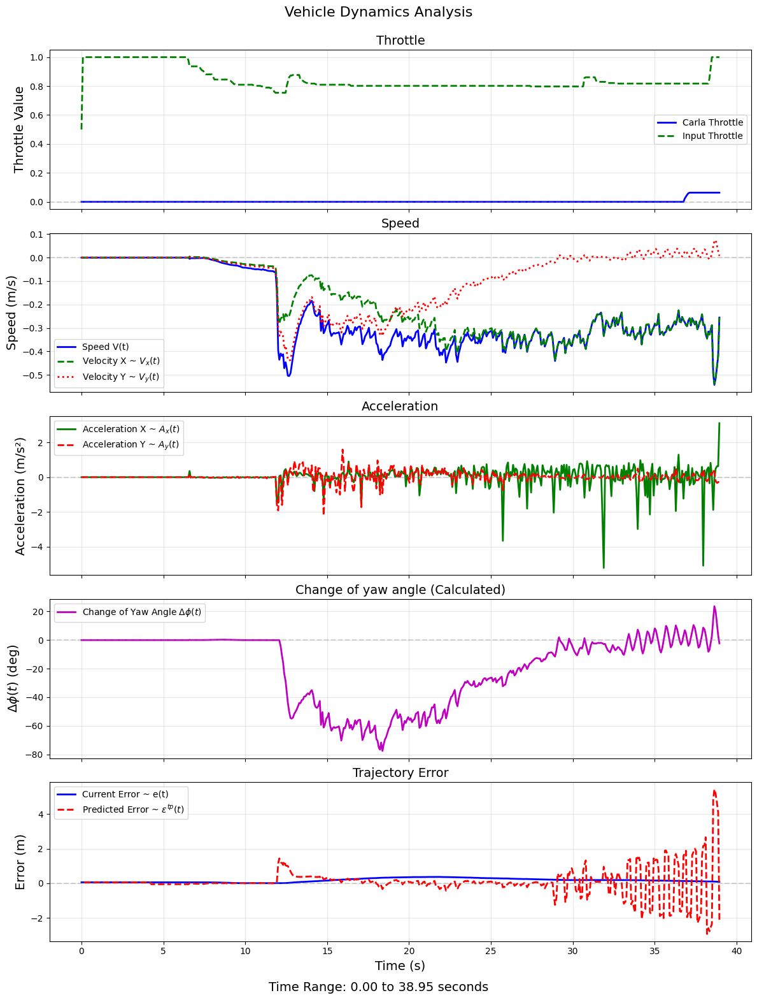

In [33]:
# pedal to vehicle dynamics

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_vehicle_dynamics(df, output_file='vehicle_dynamics_analysis'):
    """
    Create a multi-panel figure with vehicle dynamics parameters sharing a time axis.
    
    Parameters:
        df (DataFrame): The dataframe containing the data
        output_file (str): Base name for output files (without extension)
    """
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    time_column = 'Normalized Time'
    time_label = 'Time (s)'
    
    # Define plot panels and their parameters
    panel_params = [
        {
            'title': 'Throttle',
            'params': ['[Carla] Throttle', '[Input] Throttle'],
            'ylabel': 'Throttle Value',
            'colors': ['b-', 'g--'],
            'labels': ['Carla Throttle', 'Input Throttle']
        },
        {
            'title': 'Speed',
            'params': ['[Measured] Speed ~ V(t) (m/s)', '[Measured] VelocityX ~ Vx(t) (m/s)', 
                      '[Measured] VelocityY ~ Vy(t) (m/s)'],
            'ylabel': 'Speed (m/s)',
            'colors': ['b-', 'g--', 'r:'],
            'labels': [r'Speed V(t)', r'Velocity X ~ $V_x(t)$', r'Velocity Y ~ $V_y(t)$']
        },
        {
            'title': 'Acceleration',
            'params': ['[Measured] AccelerationX ~ Ax(t) (m/s^2)', '[Measured] AccelerationY ~ Ay(t) (m/s^2)'],
            'ylabel': 'Acceleration (m/s²)',
            'colors': ['g-', 'r--'],
            'labels': [r'Acceleration X ~ $A_x(t)$', r'Acceleration Y ~ $A_y(t)$']
        },
        {
            'title': 'Change of yaw angle (Calculated)',
            'params': ['[Computed] Change of Yaw Angle ~ Delta_Phi(t) (deg)'],
            'ylabel': r'$\Delta \phi (t)$ (deg)',
            'colors': ['m-'],
            'labels': [r'Change of Yaw Angle $\Delta \phi (t)$']
        },
        {
            'title': 'Trajectory Error',
            'params': ['[Computed] Current Error to Trajectory ~ e(t) (m)', 
                      '[Computed] Predicted Error to Trajectory ~ eps_tp(t) (m)'],
            'ylabel': 'Error (m)',
            'colors': ['b-', 'r--'],
            'labels': ['Current Error ~ e(t) ', r'Predicted Error ~ $\epsilon^{tp}(t)$']
        }
    ]
    
    # Create figure with subplots
    fig, axes = plt.subplots(len(panel_params), 1, figsize=(12, 15), sharex=True)
    
    # Plot each panel
    for i, panel in enumerate(panel_params):
        ax = axes[i]
        
        for j, param in enumerate(panel['params']):
            if param in df.columns:
                ax.plot(df[time_column], df[param], panel['colors'][j], 
                       linewidth=2, label=panel['labels'][j])
        
        # Add horizontal line at y=0 for reference
        ax.axhline(y=0, color='gray', linestyle='--', alpha=0.3)
        
        # Set titles and labels
        ax.set_title(panel['title'], fontsize=14)
        ax.set_ylabel(panel['ylabel'], fontsize=14)
        ax.grid(True, alpha=0.3)
        ax.legend(loc='best')
        
    # Set x-label only for the bottom subplot
    axes[-1].set_xlabel(time_label, fontsize=14)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.15)  # Reduce the space between plots
    
    # Add a super title
    fig.suptitle('Vehicle Dynamics Analysis', fontsize=16, y=1.02)
    
    # Add timestamp range to plot
    time_range = f"Time Range: {df[time_col].iloc[0]:.2f} to {df[time_col].iloc[-1]:.2f} seconds"
    fig.text(0.5, -0.01, time_range, ha='center', fontsize=14)
    
    # Save the figure as PDF
    pdf_file = f"{output_file}.pdf"
    plt.savefig(pdf_file, format='pdf', bbox_inches='tight')
    print(f"Plot saved as {pdf_file}")
    
    # Also save as PNG for quick viewing
    png_file = f"{output_file}.png"
    plt.savefig(png_file, dpi=300, bbox_inches='tight')
    print(f"Plot also saved as {png_file}")
    
    # Show the plot
    plt.show()

# Load your data and call the function
df = pd.read_excel(f'../data/path_logs/data_{recorded_time}.xlsx')

# Create the plots
os.makedirs(f'plots/{recorded_time}', exist_ok=True)
plot_vehicle_dynamics(df, output_file=f'plots/{recorded_time}/vehicle_dynamics_analysis')

Position time series saved as plots/2025-03-24_13-53-49/plot_position_time_series.pdf
Also saved as plots/2025-03-24_13-53-49/plot_position_time_series.png


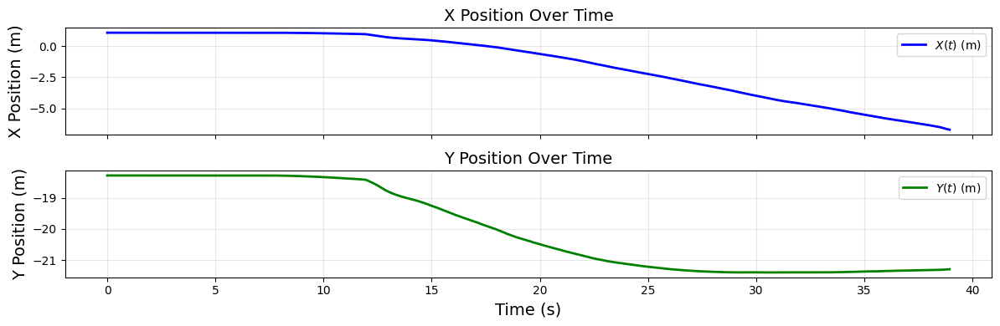

In [32]:
# position on time series
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_position_time_series(df, output_file='position_time_series'):
    """
    Create a plot of X and Y position over time.
    
    Parameters:
        df (DataFrame): The dataframe containing the position data
        output_file (str): Base name for output files (without extension)
    """
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    time_column = 'Normalized Time'
    time_label = 'Time (s)'
    
    # Create figure with position plots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 4), sharex=True)
    
    # Plot X position
    ax1.plot(df[time_column], df['[Measured] Current Position ~ X(t) (m)'], 'b-', 
            linewidth=2, label=r'$X(t)$ (m)')
    ax1.set_title('X Position Over Time', fontsize=14)
    ax1.set_ylabel('X Position (m)', fontsize=14)
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='best')
    
    # Plot Y position
    ax2.plot(df[time_column], df['[Measured] Current Position ~ Y(t) (m)'], 'g-', 
            linewidth=2, label=r'$Y(t)$ (m)')
    ax2.set_title('Y Position Over Time', fontsize=14)
    ax2.set_xlabel(time_label, fontsize=14)
    ax2.set_ylabel('Y Position (m)', fontsize=14)
    ax2.grid(True, alpha=0.3)
    ax2.legend(loc='best')
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the figure as PDF
    pdf_file = f"{output_file}.pdf"
    plt.savefig(pdf_file, format='pdf', bbox_inches='tight')
    print(f"Position time series saved as {pdf_file}")
    
    # Also save as PNG for quick viewing
    png_file = f"{output_file}.png"
    plt.savefig(png_file, dpi=300, bbox_inches='tight')
    print(f"Also saved as {png_file}")
    
    # Show the plot
    plt.show()
    

# Load your data
# Load your data and call the function
df = pd.read_excel(f'../data/path_logs/data_{recorded_time}.xlsx')

# Create the plots
os.makedirs(f'plots/{recorded_time}', exist_ok=True)

# Create the plots
plot_position_time_series(df, f'plots/{recorded_time}/plot_position_time_series')

Velocity vector analysis saved as plots/2025-03-24_13-53-49/velocity_vector_analysis.pdf
Also saved as plots/2025-03-24_13-53-49/velocity_vector_analysis.png


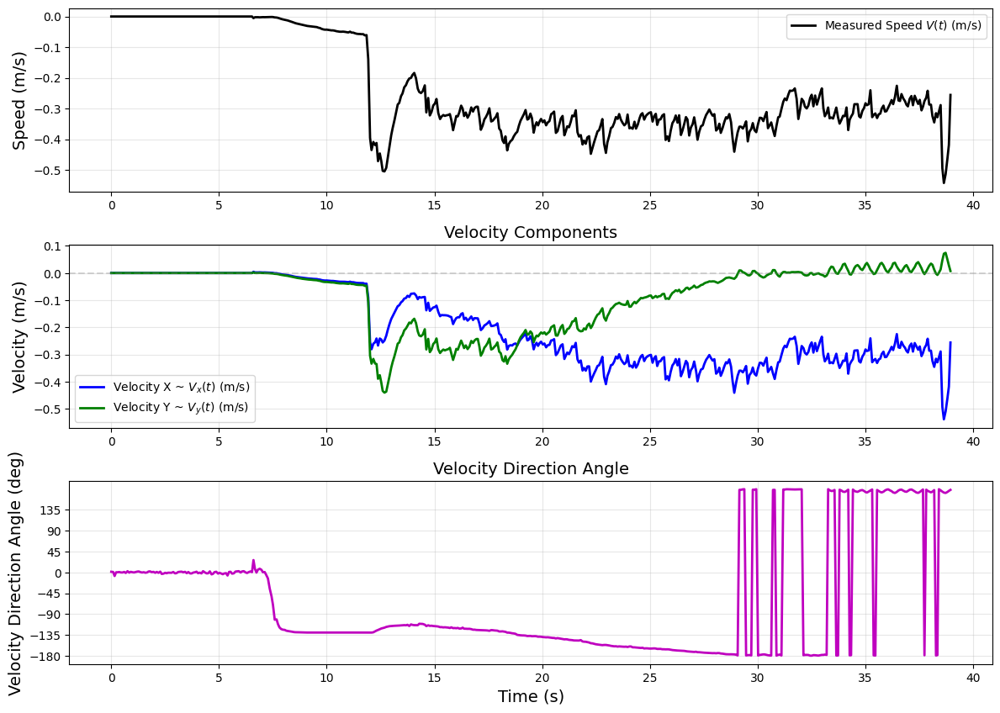

In [35]:
# velocity vector analysis
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np

def plot_velocity_vectors(df, output_file='velocity_vector_analysis'):
    """
    Create visualizations of velocity vectors, analyzing magnitude, direction, and angle over time.
    
    Parameters:
        df (DataFrame): The dataframe containing the velocity data
        output_file (str): Base name for output files (without extension)
    """
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    time_column = 'Normalized Time'
    time_label = 'Time (s)'
    
    # Calculate velocity magnitude and direction
    vx = df['[Measured] VelocityX ~ Vx(t) (m/s)']
    vy = df['[Measured] VelocityY ~ Vy(t) (m/s)']
    
    # Calculate angle between velocity vector and x-axis in degrees
    # Note: arctan2 returns angle in radians, we convert to degrees
    # arctan2(y, x) gives the angle in the correct quadrant
    df['Velocity_angle'] = np.degrees(np.arctan2(vy, vx))
    
    # Calculate speed (magnitude of velocity vector)
    df['Speed_calc'] = np.sqrt(vx**2 + vy**2)
    
    # Create figure with multiple panels
    fig = plt.figure(figsize=(12, 12))
    gs = fig.add_gridspec(4, 1, height_ratios=[1, 1, 1, 1.5])
    
    # Panel 1: Speed over time
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(df[time_column], df['[Measured] Speed ~ V(t) (m/s)'], 'k-', 
            linewidth=2, label=r'Measured Speed $V(t)$ (m/s)')
    ax1.set_ylabel('Speed (m/s)', fontsize=14)
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='best')
    
    # Panel 2: Velocity components over time
    ax2 = fig.add_subplot(gs[1], sharex=ax1)
    ax2.plot(df[time_column], vx, 'b-', linewidth=2, label=r'Velocity X ~ $V_x(t)$ (m/s)')
    ax2.plot(df[time_column], vy, 'g-', linewidth=2, label=r'Velocity Y ~ $V_y(t)$ (m/s)')
    ax2.axhline(y=0, color='gray', linestyle='--', alpha=0.3)
    ax2.set_title('Velocity Components', fontsize=14)
    ax2.set_ylabel('Velocity (m/s)', fontsize=14)
    ax2.grid(True, alpha=0.3)
    ax2.legend(loc='best')
    
    # Panel 3: Direction angle over time
    ax3 = fig.add_subplot(gs[2], sharex=ax1)
    ax3.plot(df[time_column], df['Velocity_angle'], 'm-', linewidth=2)
    ax3.set_title('Velocity Direction Angle', fontsize=14)
    ax3.set_ylabel('Velocity Direction Angle (deg)', fontsize=14)
    ax3.set_yticks(np.arange(-180, 180, 45))
    ax3.grid(True, alpha=0.3)
   
    # Set x-label only for the bottom subplot
    ax3.set_xlabel(time_label, fontsize=14)
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the figure as PDF
    pdf_file = f"{output_file}.pdf"
    plt.savefig(pdf_file, format='pdf', bbox_inches='tight')
    print(f"Velocity vector analysis saved as {pdf_file}")
    
    # Also save as PNG for quick viewing
    png_file = f"{output_file}.png"
    plt.savefig(png_file, dpi=300, bbox_inches='tight')
    print(f"Also saved as {png_file}")
    
    plt.show()
    

# Load your data
# Load your data and call the function
df = pd.read_excel(f'../data/path_logs/data_{recorded_time}.xlsx')

# Create the plots
os.makedirs(f'plots/{recorded_time}', exist_ok=True)

# Create the plots
plot_velocity_vectors(df, output_file=f'plots/{recorded_time}/velocity_vector_analysis')

Plot saved as plots/2025-03-24_13-53-49/acceleration_time_series.pdf


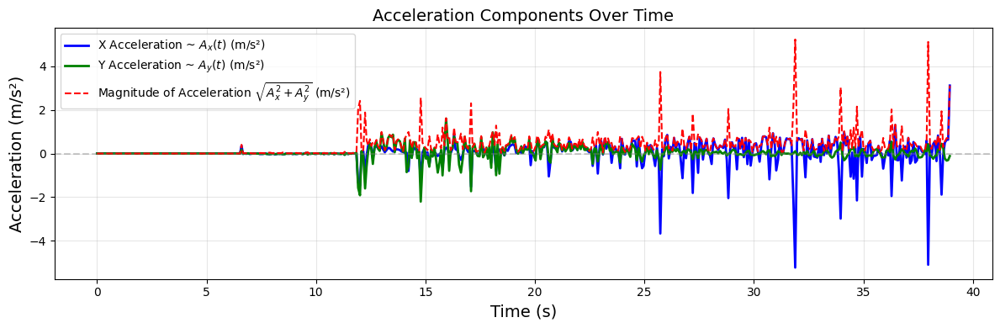

In [37]:
# acceleration time series
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
plt.style.use("default")
def plot_acceleration_time_series(df, output_file='acceleration_time_series'):
    """
    Create a simple plot of acceleration components over time.
    
    Parameters:
        df (DataFrame): The dataframe containing acceleration data
        output_file (str): Base filename for output (without extension)
    """
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    time_column = 'Normalized Time'
    time_label = 'Time (s)'
    
    # Create figure with acceleration plot
    plt.figure(figsize=(12, 4))
    
    # Plot acceleration components
    plt.plot(df[time_column], df['[Measured] AccelerationX ~ Ax(t) (m/s^2)'], 'b-', 
             linewidth=2, label=r'X Acceleration ~ $A_x(t)$ (m/s²)')
    plt.plot(df[time_column], df['[Measured] AccelerationY ~ Ay(t) (m/s^2)'], 'g-', 
             linewidth=2, label=r'Y Acceleration ~ $A_y(t)$ (m/s²)')
    
    # Add horizontal line at y=0 for reference
    plt.axhline(y=0, color='gray', linestyle='--', alpha=0.4)
    
    # Set labels and title
    plt.title('Acceleration Components Over Time', fontsize=14)
    plt.xlabel(time_label, fontsize=14)
    plt.ylabel('Acceleration (m/s²)', fontsize=14)
    
    
    
    # Add grid and improve appearance
    plt.grid(True, alpha=0.3)
    
    # Calculate and display acceleration magnitude
    acc_magnitude = np.sqrt(
        df['[Measured] AccelerationX ~ Ax(t) (m/s^2)']**2 + 
        df['[Measured] AccelerationY ~ Ay(t) (m/s^2)']**2
    )
    plt.plot(df[time_column], acc_magnitude, 'r--', 
             linewidth=1.5, label=r'Magnitude of Acceleration $\sqrt{A_x^2 + A_y^2}$ (m/s²)')
    
    # Adjust layout
    plt.tight_layout()
    plt.grid(True, alpha=0.3)
    plt.legend(loc='best')
    
    # Save the figure as PDF
    pdf_file = f"{output_file}.pdf"
    plt.savefig(pdf_file, format='pdf', bbox_inches='tight')
    print(f"Plot saved as {pdf_file}")
    
    # Show the plot
    plt.show()

# Load your data
# Load your data and call the function
df = pd.read_excel(f'../data/path_logs/data_{recorded_time}.xlsx')

# Create the plots
os.makedirs(f'plots/{recorded_time}', exist_ok=True)

# Create the plot
plot_acceleration_time_series(df, output_file=f'plots/{recorded_time}/acceleration_time_series')

Plots saved as plots/2025-03-24_13-53-49/yaw_angle_time_series.pdf and plots/2025-03-24_13-53-49/yaw_angle_time_series.png


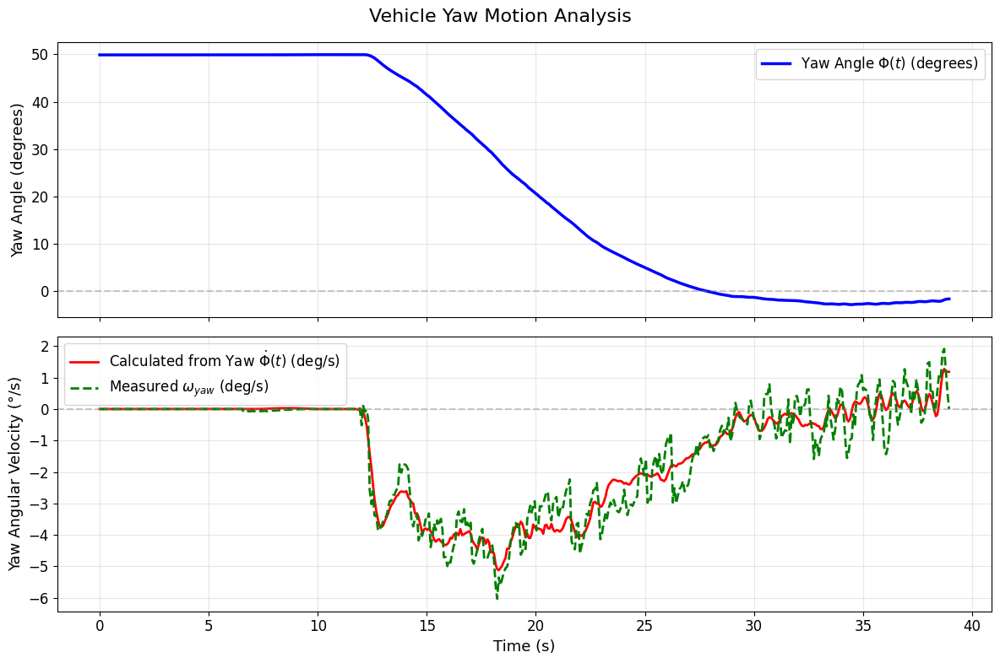

In [39]:
# yaw angle time series

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_yaw_angle_time_series(df, output_file='yaw_angle_time_series'):
    """
    Create simple time series plots for yaw angle and angular velocity,
    including comparison between measured and calculated angular velocity.
    
    Parameters:
        df (DataFrame): The dataframe containing the vehicle data
        output_file (str): Base filename for output (without extension)
    """
    # Set up plot style for clean presentation
    plt.style.use('default')
    plt.rcParams.update({'font.size': 12})
    
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    time_column = 'Normalized Time'
    
    # Calculate angular velocity from yaw angle changes
    # First, convert yaw angle to a continuous value (unwrapped)
    yaw_angles = df['[Measured] Current Yaw Angle ~ Phi(t) (deg)'].values
    continuous_yaw = np.unwrap(np.radians(yaw_angles))
    continuous_yaw_deg = np.degrees(continuous_yaw)
    df['Unwrapped_Yaw'] = continuous_yaw_deg
    
    # Calculate the rate of change of yaw (derivative)
    df['Calculated_Angular_Velocity'] = df['Unwrapped_Yaw'].diff() / df[time_column].diff()
    
    # Apply a small amount of smoothing to reduce noise in the derivative
    window_size = 5
    if len(df) > window_size * 2:
        df['Calculated_Angular_Velocity'] = df['Calculated_Angular_Velocity'].rolling(
            window=window_size, center=True).mean().fillna(method='bfill').fillna(method='ffill')
    
    # Create a figure with two subplots sharing x-axis
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
    
    # Plot 1: Yaw Angle
    ax1.plot(df[time_column], df['[Measured] Current Yaw Angle ~ Phi(t) (deg)'], 
             'b-', linewidth=2.5, label=r'Yaw Angle $\Phi(t)$ (degrees)')
    
    # Add horizontal line at y=0
    ax1.axhline(y=0, color='gray', linestyle='--', alpha=0.4)
    
    # Set labels for first plot
    ax1.set_ylabel('Yaw Angle (degrees)', fontsize=13)
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='best')
    
    # Plot 2: Angular Velocity comparison
    ax2.plot(df[time_column], df['Calculated_Angular_Velocity'], 
            'r-', linewidth=2.0, label=r'Calculated from Yaw $\dot{\Phi}(t)$ (deg/s)')
    
    if '[Measured] Angular VelocityZ ~ Phi_dot(t) (deg/s)' in df.columns:
        # Convert to degrees per second for more intuitive reading
        df['Measured_Angular_Velocity_deg_s'] = df['[Measured] Angular VelocityZ ~ Phi_dot(t) (deg/s)'] 
        ax2.plot(df[time_column], df['Measured_Angular_Velocity_deg_s'], 
                'g--', linewidth=2.0, label=r'Measured $\omega_{yaw}$ (deg/s)')
    
    # Add horizontal line at y=0
    ax2.axhline(y=0, color='gray', linestyle='--', alpha=0.4)
    
    # Set labels for second plot
    ax2.set_xlabel('Time (s)', fontsize=13)
    ax2.set_ylabel('Yaw Angular Velocity (°/s)', fontsize=13)
    ax2.grid(True, alpha=0.3)
    ax2.legend(loc='best')
    
    # Add a title for the overall figure
    fig.suptitle('Vehicle Yaw Motion Analysis', fontsize=16, y=0.98)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    
    # Save the figures
    plt.savefig(f"{output_file}.pdf", format='pdf', bbox_inches='tight')
    plt.savefig(f"{output_file}.png", format='png', dpi=300, bbox_inches='tight')
    print(f"Plots saved as {output_file}.pdf and {output_file}.png")
    

# Load your data
# Load your data and call the function
df = pd.read_excel(f'../data/path_logs/data_{recorded_time}.xlsx')

# Create the plots
os.makedirs(f'plots/{recorded_time}', exist_ok=True)

# Create the yaw angle plots
plot_yaw_angle_time_series(df, output_file=f'plots/{recorded_time}/yaw_angle_time_series')

Plots saved as plots/2025-03-24_13-53-49/steering_angles_time_series.pdf and plots/2025-03-24_13-53-49/steering_angles_time_series.png
Wheel angles comparison saved as plots/2025-03-24_13-53-49/steering_angles_time_series_wheel_angles_comparison.pdf and plots/2025-03-24_13-53-49/steering_angles_time_series_wheel_angles_comparison.png
Correlation plot saved as plots/2025-03-24_13-53-49/steering_angles_time_series_correlation.pdf and plots/2025-03-24_13-53-49/steering_angles_time_series_correlation.png


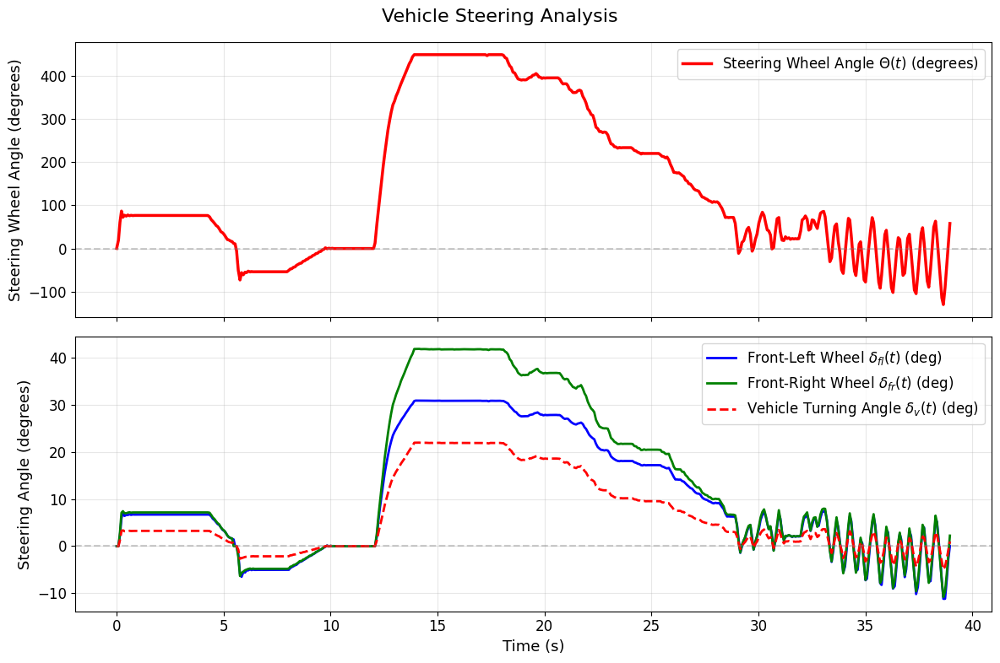

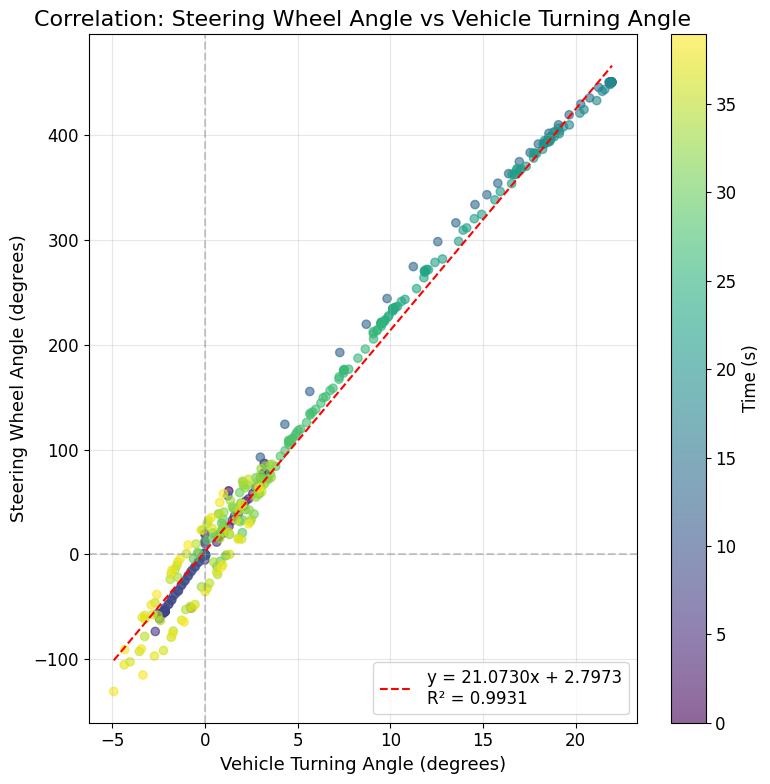

In [41]:
# SWA on time series
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_steering_angles_time_series(df, output_file='steering_angles_time_series'):
    """
    Create simple time series plots for steering angles and vehicle turning angle.
    
    Parameters:
        df (DataFrame): The dataframe containing the vehicle data
        output_file (str): Base filename for output (without extension)
    """
    # Set up plot style for clean presentation
    plt.style.use('default')
    plt.rcParams.update({'font.size': 12})
    
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    time_column = 'Normalized Time'
    
    # Create a figure with two subplots sharing x-axis
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
    
    # Plot 1: Steering Wheel Angle
    ax1.plot(df[time_column], df['[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg)'], 
             'r-', linewidth=2.5, label=r'Steering Wheel Angle $\Theta(t)$ (degrees)')
    
    # Add horizontal line at y=0
    ax1.axhline(y=0, color='gray', linestyle='--', alpha=0.4)
    
    # Set labels for first plot
    ax1.set_ylabel('Steering Wheel Angle (degrees)', fontsize=13)
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='best')
    
    # Plot 2: Wheel Steering Angles and Vehicle Turning Angle
    ax2.plot(df[time_column], df['[Measured] Steering Angle FL ~ delta_fl(t) (deg)'], 
            'b-', linewidth=2.0, label=r'Front-Left Wheel $\delta_{fl}(t)$ (deg)')
    ax2.plot(df[time_column], df['[Measured] Steering Angle FR ~ delta_fr(t) (deg)'], 
            'g-', linewidth=2.0, label=r'Front-Right Wheel $\delta_{fr}(t)$ (deg)')
    ax2.plot(df[time_column], df['[Computed] Vehicle Steering Angle ~ Delta_v(t) (deg)'], 
            'r--', linewidth=2.0, label=r'Vehicle Turning Angle $\delta_v(t)$ (deg)')
    
    # Add horizontal line at y=0
    ax2.axhline(y=0, color='gray', linestyle='--', alpha=0.4)
    
    # Set labels for second plot
    ax2.set_xlabel('Time (s)', fontsize=13)
    ax2.set_ylabel('Steering Angle (degrees)', fontsize=13)
    ax2.grid(True, alpha=0.3)
    ax2.legend(loc='best')
    
    # Add a title for the overall figure
    fig.suptitle('Vehicle Steering Analysis', fontsize=16, y=0.98)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    
    # Save the figures
    plt.savefig(f"{output_file}.pdf", format='pdf', bbox_inches='tight')
    plt.savefig(f"{output_file}.png", format='png', dpi=300, bbox_inches='tight')
    print(f"Plots saved as {output_file}.pdf and {output_file}.png")
    
    
    # Save the comparison plot
    angles_filename = f"{output_file}_wheel_angles_comparison"
    plt.savefig(f"{angles_filename}.pdf", format='pdf', bbox_inches='tight')
    plt.savefig(f"{angles_filename}.png", format='png', dpi=300, bbox_inches='tight')
    print(f"Wheel angles comparison saved as {angles_filename}.pdf and {angles_filename}.png")
    
    # Create a correlation plot between steering wheel angle and vehicle turning angle
    plt.figure(figsize=(8, 8))
    plt.scatter(df['[Computed] Vehicle Steering Angle ~ Delta_v(t) (deg)'],
                df['[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg)'],
               alpha=0.6, c=df[time_column], cmap='viridis')
    
    # Add a best fit line
    from scipy.stats import linregress
    slope, intercept, r_value, p_value, std_err = linregress(
        df['[Computed] Vehicle Steering Angle ~ Delta_v(t) (deg)'], df['[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg)'])
    
    x = np.array([df['[Computed] Vehicle Steering Angle ~ Delta_v(t) (deg)'].min(),
                 df['[Computed] Vehicle Steering Angle ~ Delta_v(t) (deg)'].max()])
    plt.plot(x, slope*x + intercept, 'r--', 
            label=f'y = {slope:.4f}x + {intercept:.4f}\nR² = {r_value**2:.4f}')
    
    plt.axhline(y=0, color='gray', linestyle='--', alpha=0.4)
    plt.axvline(x=0, color='gray', linestyle='--', alpha=0.4)
    plt.xlabel('Vehicle Turning Angle (degrees)', fontsize=13)
    plt.ylabel('Steering Wheel Angle (degrees)', fontsize=13)
    plt.title('Correlation: Steering Wheel Angle vs Vehicle Turning Angle', fontsize=16)
    plt.grid(True, alpha=0.3)
    plt.legend(loc='best')
    plt.colorbar(label='Time (s)')
    plt.tight_layout()
    
    # Save the correlation plot
    corr_filename = f"{output_file}_correlation"
    plt.savefig(f"{corr_filename}.pdf", format='pdf', bbox_inches='tight')
    plt.savefig(f"{corr_filename}.png", format='png', dpi=300, bbox_inches='tight')
    print(f"Correlation plot saved as {corr_filename}.pdf and {corr_filename}.png")

# Load your data
# Load your data and call the function
df = pd.read_excel(f'../data/path_logs/data_{recorded_time}.xlsx')

# Create the plots
os.makedirs(f'plots/{recorded_time}', exist_ok=True)

# Create the steering angle plots
plot_steering_angles_time_series(df, output_file=f'plots/{recorded_time}/steering_angles_time_series')

In [ ]:
# predicted position on time series
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_prediction_metrics_time_series(df, output_file='prediction_metrics_time_series'):
    """
    Create time series plots for prediction metrics including predicted position,
    predicted yaw angle, and desired steering wheel angle, with X and Y positions in separate plots.
    
    Parameters:
        df (DataFrame): The dataframe containing the vehicle data
        output_file (str): Base filename for output (without extension)
    """
    # Set up plot style
    plt.style.use('default')
    plt.rcParams.update({'font.size': 12})
    
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    time_column = 'Normalized Time'
    
    # Create figure with subplots - now with 4 panels instead of 3
    fig, axes = plt.subplots(4, 1, figsize=(12, 16), sharex=True)
    
    # Plot 1: X Position (Measured vs Predicted)
    axes[0].plot(df[time_column], df['[Measured] Current Position ~ X(t) (m)'], 'b-', 
                linewidth=2, label=r'Measured X Position $X(t)$ (m)')
    axes[0].plot(df[time_column], df['[Computed] Predicted Position ~ X_tp(t) (m)'], 'r--', 
                linewidth=2, label=r'Predicted X Position $X^{tp}(t)$ (m)')
    
    # Calculate X positional error
    df['Position_Error_X'] = df['[Measured] Current Position ~ X(t) (m)'] - df['[Computed] Predicted Position ~ X_tp(t) (m)']
    
    # Add error as text annotation
    mean_error_x = df['Position_Error_X'].mean()
    max_error_x = df['Position_Error_X'].max()
    axes[0].text(0.02, 0.8, f'Mean X Error: {mean_error_x:.4f} m\nMax X Error: {max_error_x:.4f} m', 
                transform=axes[0].transAxes, bbox=dict(facecolor='white', alpha=0.7))
    
    axes[0].set_ylabel('X Position (m)', fontsize=14)
    axes[0].set_title('Measured vs Predicted X Position', fontsize=16)
    axes[0].grid(True, alpha=0.3)
    axes[0].legend(loc='upper right')
    
    # Plot 2: Y Position (Measured vs Predicted)
    axes[1].plot(df[time_column], df['[Measured] Current Position ~ Y(t) (m)'], 'g-', 
                linewidth=2, label=r'Measured Y Position $Y(t)$ (m)')
    axes[1].plot(df[time_column], df['[Computed] Predicted Position ~ Y_tp(t) (m)'], 'r--', 
                linewidth=2, label=r'Predicted Y Position $Y^{tp}(t)$ (m)')
    
    # Calculate Y positional error
    df['Position_Error_Y'] = df['[Measured] Current Position ~ Y(t) (m)'] - df['[Computed] Predicted Position ~ Y_tp(t) (m)']
    
    # Add error as text annotation
    mean_error_y = df['Position_Error_Y'].mean()
    max_error_y = df['Position_Error_Y'].max()
    axes[1].text(0.02, 0.8, f'Mean Y Error: {mean_error_y:.4f} m\nMax Y Error: {max_error_y:.4f} m', 
                transform=axes[1].transAxes, bbox=dict(facecolor='white', alpha=0.7))
    
    axes[1].set_ylabel('Y Position (m)', fontsize=14)
    axes[1].set_title('Measured vs Predicted Y Position', fontsize=16)
    axes[1].grid(True, alpha=0.3)
    axes[1].legend(loc='upper right')
    
    # Calculate total positional error
    df['Position_Error'] = np.sqrt(df['Position_Error_X']**2 + df['Position_Error_Y']**2)
    
    # Plot 3: Yaw Angle (Measured vs Predicted)
    axes[2].plot(df[time_column], df['[Measured] Current Yaw Angle ~ Phi(t) (deg)'], 'b-', 
                linewidth=2.5, label=r'Measured Yaw Angle $\phi(t)$ (deg)')
    axes[2].plot(df[time_column], df['[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)'], 'r--', 
                linewidth=2, label=r'Predicted Yaw Angle $\phi^{tp}(t)$ (deg)')
    axes[2].plot(df[time_column], df['[Computed] Change of Yaw Angle ~ Delta_Phi(t) (deg)'], 'g:', 
                linewidth=1.5, label=r'Chang of Yaw Angle $\Delta \phi(t)$ (deg)')
    
    # Add horizontal line at y=0 for reference
    axes[2].axhline(y=0, color='gray', linestyle='--', alpha=0.4)
    
    # Calculate yaw prediction error
    df['Yaw_Error'] = df['[Measured] Current Yaw Angle ~ Phi(t) (deg)'] - df['[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)']
    mean_yaw_error = np.abs(df['Yaw_Error']).mean()
    max_yaw_error = np.abs(df['Yaw_Error']).max()
    axes[2].text(0.02, 0.8, f'Mean Yaw Error: {mean_yaw_error:.4f}°\nMax Yaw Error: {max_yaw_error:.4f}°', 
                transform=axes[2].transAxes, bbox=dict(facecolor='white', alpha=0.7))
    
    axes[2].set_ylabel('Yaw Angle (degrees)', fontsize=14)
    axes[2].set_title('Measured vs Predicted Yaw Angle', fontsize=16)
    axes[2].grid(True, alpha=0.3)
    axes[2].legend(loc='upper right')
    
    # Plot 4: Steering Wheel Angle (Measured vs Desired)
    axes[3].plot(df[time_column], df['[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg)'], 'b-', 
                linewidth=2.5, label=r'Measured SWA $\Theta(t)$ (deg)')
    axes[3].plot(df[time_column], df['[Computed] Desired Steering Wheel Angle ~ Theta_d(t) (deg)'], 'r--', 
                linewidth=2, label=r'Desired SWA $\Theta_d(t)$ (deg)')
    
    # Add horizontal line at y=0 for reference
    axes[3].axhline(y=0, color='gray', linestyle='--', alpha=0.4)
    
    # Calculate steering error and torque correlation
    df['Steering_Error'] = df['[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg)'] - df['[Computed] Desired Steering Wheel Angle ~ Theta_d(t) (deg)']
    mean_steering_error = np.abs(df['Steering_Error']).mean()
    max_steering_error = np.abs(df['Steering_Error']).max()
    
    # Correlation between steering error and applied torque
    correlation = df['Steering_Error'].corr(df['[Computed] Torque applied ~ Tau_das (N.m)'])
    
    axes[3].text(0.02, 0.8, 
                f'Mean Steering Error: {mean_steering_error:.4f}°\nMax Steering Error: {max_steering_error:.4f}°\nError-Torque Correlation: {correlation:.4f}', 
                transform=axes[3].transAxes, bbox=dict(facecolor='white', alpha=0.7))
    
    # Add torque on secondary y-axis
    ax2 = axes[3].twinx()
    ax2.plot(df[time_column], df['[Computed] Torque applied ~ Tau_das (N.m)'], 'g:', 
            linewidth=2, label=r'Applied Torque $\tau_{das}(t)$ (N·m)')
    ax2.set_ylabel('Torque (N·m)', color='g', fontsize=14)
    ax2.tick_params(axis='y', labelcolor='g')
    
    # Combine legends
    lines1, labels1 = axes[3].get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    axes[3].legend(lines1 + lines2, labels1 + labels2, loc='lower right')
    
    axes[3].set_xlabel('Time (s)', fontsize=14)
    axes[3].set_ylabel('Steering Wheel Angle (degrees)', fontsize=14)
    axes[3].set_title('Measured vs Desired Steering Wheel Angle and Applied Torque', fontsize=16)
    axes[3].grid(True, alpha=0.3)
    
    # Adjust layout and save
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.3)
    
    # Save the figure
    plt.savefig(f"{output_file}.pdf", format='pdf', bbox_inches='tight')
    plt.savefig(f"{output_file}.png", format='png', dpi=300, bbox_inches='tight')
    print(f"Plot saved as {output_file}.pdf and {output_file}.png")
    
    # Also create a plot of position errors over time
    plt.figure(figsize=(12, 6))
    plt.plot(df[time_column], df['Position_Error_X'], 'b-', marker='o',
            linewidth=2, label='X Position Error')
    plt.plot(df[time_column], df['Position_Error_Y'], 'g-', marker='o',
            linewidth=2, label='Y Position Error')
    plt.plot(df[time_column], df['Position_Error'], 'r-', 
            linewidth=2, label='Total Error')
    
    plt.axhline(y=0, color='gray', linestyle='--', alpha=0.4)
    plt.xlabel('Time (s)', fontsize=14)
    plt.ylabel('Error (m)', fontsize=14)
    plt.title('Position Prediction Errors Over Time', fontsize=16)
    plt.grid(True, alpha=0.3)
    plt.legend(loc='best')
    
    # Save the error plot
    plt.savefig(f"{output_file}_errors.pdf", format='pdf', bbox_inches='tight')
    plt.savefig(f"{output_file}_errors.png", format='png', dpi=300, bbox_inches='tight')
    print(f"Error plot saved as {output_file}_errors.pdf and {output_file}_errors.png")
    
    # Create a 2D visualization of measured vs predicted positions (unchanged)
    plt.figure()
    
    # Select a subset of points for better visualization (every Nth point)
    skip = max(1, len(df) // 50)  # Show about 50 points
    subset = df.iloc[::skip].copy()
    
    plt.plot(subset['[Measured] Current Position ~ Y(t) (m)'], 
             subset['[Measured] Current Position ~ X(t) (m)'], 
             'bo-', linewidth=1.5, markersize=4, label='Measured Path')
    plt.plot(subset['[Computed] Predicted Position ~ Y_tp(t) (m)'], 
             subset['[Computed] Predicted Position ~ X_tp(t) (m)'], 
             'ro-', linewidth=1.5, markersize=4, label='Predicted Path')
    
    # Connect measured and predicted points with thin lines
    for i in range(len(subset)):
        plt.plot([subset['[Measured] Current Position ~ Y(t) (m)'].iloc[i], 
                  subset['[Computed] Predicted Position ~ Y_tp(t) (m)'].iloc[i]],
                 [subset['[Measured] Current Position ~ X(t) (m)'].iloc[i], 
                  subset['[Computed] Predicted Position ~ X_tp(t) (m)'].iloc[i]],
                 'k--', linewidth=0.5, alpha=0.3)
    
    # Add arrows to show direction of travel
    for i in range(0, len(subset), 5):
        # Measured direction arrow
        plt.arrow(subset['[Measured] Current Position ~ Y(t) (m)'].iloc[i], 
                 subset['[Measured] Current Position ~ X(t) (m)'].iloc[i],
                 0.3*np.sin(np.radians(subset['[Measured] Current Yaw Angle ~ Phi(t) (deg)'].iloc[i])),
                 0.3*np.cos(np.radians(subset['[Measured] Current Yaw Angle ~ Phi(t) (deg)'].iloc[i])),
                 head_width=0.1, head_length=0.2, fc='blue', ec='blue')
        
        # Predicted direction arrow
        plt.arrow(subset['[Computed] Predicted Position ~ Y_tp(t) (m)'].iloc[i], 
                 subset['[Computed] Predicted Position ~ X_tp(t) (m)'].iloc[i],
                 0.3*np.sin(np.radians(subset['[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)'].iloc[i])),
                 0.3*np.cos(np.radians(subset['[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)'].iloc[i])),
                 head_width=0.1, head_length=0.2, fc='red', ec='red')
    
    plt.grid(True, alpha=0.3)
    plt.axis('equal')
    plt.xlabel('Y Position (m)', fontsize=14)
    plt.ylabel('X Position (m)', fontsize=14)
    plt.title('2D Visualization of Measured vs Predicted Positions', fontsize=16)
    plt.legend(loc='best')
    
    plt.savefig(f"{output_file}_2D_path.pdf", format='pdf', bbox_inches='tight')
    plt.savefig(f"{output_file}_2D_path.png", format='png', dpi=300, bbox_inches='tight')
    print(f"2D path plot saved as {output_file}_2D_path.pdf and {output_file}_2D_path.png")
    
    return df

# Load the data and create the plots
# Load your data and call the function
df = pd.read_excel(f'../data/path_logs/data_{recorded_time}.xlsx')

# Create the plots
os.makedirs(f'plots/{recorded_time}', exist_ok=True)

# Generate the plots
df_processed = plot_prediction_metrics_time_series(df, trajectory=predefined, output_file=f'plots/{recorded_time}/prediction_metrics_time_series')

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import os

def create_concise_time_series(df, output_file='concise_time_series.pdf', start_time=13):
    """
    Create streamlined time series plots for parameters in the dataframe,
    with 4 plots per page and combined plots with dual axes as specified.
    
    Parameters:
        df (DataFrame): The dataframe containing the haptic control data
        output_file (str): Output PDF filename
        start_time (float): Starting time in seconds for data filtering
    """
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    
    # Filter data starting from the specified time
    df_filtered = df[df['Normalized Time'] >= start_time].copy()
    df_filtered['Normalized Time'] = df_filtered['Normalized Time'] - start_time
    time_column = 'Normalized Time'
    time_label = 'Time (s)'
    
    # Set consistent plotting style for maximum compactness
    plt.style.use('default')
    plt.rcParams.update({
        'font.size': 14,
        'axes.titlesize': 14,
        'axes.labelsize': 13,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12,
        'figure.titlesize': 14,
    })
    
    # Create the PDF file
    with PdfPages(output_file) as pdf:
        # PAGE 1: 4 plots - X positions, Y positions, Yaw angle, Trajectory error
        # fig = plt.figure(figsize=(12, 16))  # A4 size, portrait
        fig, axes = plt.subplots(4, 1, figsize=(12, 16), sharex=True)
        
        # Define grid layout for the plots (4 panels)
        # gs = plt.GridSpec(4, 1, figure=fig, height_ratios=[1, 1, 1, 1], hspace=0.3)
        
        # 1. POSITIONS X (measured vs predicted)
        # ax1 = fig.add_subplot(gs[0])
        axes[0].plot(df_filtered[time_column], df_filtered['[Measured] Current Position ~ X(t) (m)'], 'b-', linewidth=1, label=r'Current X Position $X(t)$ (m)')
        axes[0].plot(df_filtered[time_column], df_filtered['[Computed] Predicted Position ~ X_tp(t) (m)'], 'r--', linewidth=1, label=r'Predicted X Position $X^{tp}(t)$ (m)')
        axes[0].set_title('X Position (Measured vs Predicted)', fontsize=14)
        axes[0].set_ylabel('X Position (m)', fontsize=14)
        axes[0].grid(True, alpha=0.3)
        axes[0].legend(loc='best')
        
        # 2. POSITIONS Y (measured vs predicted)
        # axes[1] = fig.add_subplot(gs[1])
        axes[1].plot(df_filtered[time_column], df_filtered['[Measured] Current Position ~ Y(t) (m)'], 'b-', linewidth=1, label=r'Current Y Position $Y(t)$ (m)')
        axes[1].plot(df_filtered[time_column], df_filtered['[Computed] Predicted Position ~ Y_tp(t) (m)'], 'r--', linewidth=1, label=r'Predicted Y Position $Y^{tp}(t)$ (m)')
        axes[1].set_title('Y Position (Measured vs Predicted)', fontsize=14)
        axes[1].set_ylabel('Y Position (m)', fontsize=14)
        axes[1].grid(True, alpha=0.3)
        axes[1].legend(loc='best')
        
        # 3. YAW ANGLE (measured vs predicted) - SEPARATE
        # axes[2] = fig.add_subplot(gs[2])
        axes[2].plot(df_filtered[time_column], df_filtered['[Measured] Current Yaw Angle ~ Phi(t) (deg)'], 'b-', linewidth=1, label=r'Measured Yaw Angle $\phi(t)$ (deg)')
        axes[2].plot(df_filtered[time_column], df_filtered['[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)'], 'r--', linewidth=1, label=r'Predicted Yaw Angle $\phi^{tp}(t)$ (deg)')
        axes[2].set_title('Yaw Angle (Measured vs Predicted)', fontsize=14)
        axes[2].set_ylabel('Yaw Angle (deg)', fontsize=14)
        axes[2].grid(True, alpha=0.3)
        axes[2].legend(loc='best')
        
        # 4. TRAJECTORY ERROR (current and predicted) - SEPARATE
        # ax4 = fig.add_subplot(gs[3])
        axes[3].plot(df_filtered[time_column], df_filtered['[Computed] Current Error to Trajectory ~ e(t) (m)'], 'b-', linewidth=1, label=r'Current Error to Trajectory $e(t)$ (m)')
        axes[3].plot(df_filtered[time_column], df_filtered['[Computed] Predicted Error to Trajectory ~ eps_tp(t) (m)'], 'r--', linewidth=1, label=r'Predicted Error to Trajectory $\epsilon^{tp}(t)$ (m)')
        axes[3].axhline(y=0, color='gray', linestyle='--', alpha=0.4)
        axes[3].set_title('Trajectory Error', fontsize=14)
        axes[3].set_xlabel(time_label, fontsize=14)
        axes[3].set_ylabel('Error (m)', fontsize=14)
        axes[3].grid(True, alpha=0.3)
        axes[3].legend(loc='best')
        
        plt.tight_layout()
        pdf.savefig()
        plt.close()
        
        # PAGE 2: 4 plots with combined plots and dual axes
        # fig = plt.figure(figsize=(12, 16))  # A4 size, portrait
        # gs = plt.GridSpec(4, 1, figure=fig, height_ratios=[1, 1, 1, 1], hspace=0.3)
        fig, axes = plt.subplots(4, 1, figsize=(12, 16), sharex=True)
        
        # 1. SPEED AND VELOCITY with ACCELERATION ON RIGHT AXIS
        # ax1 = fig.add_subplot(gs[0])
        axes[0].plot(df_filtered[time_column], df_filtered['[Measured] Speed ~ V(t) (m/s)'], 'k-', linewidth=1.5, label=r'Speed $V(t)$ (m/s)')
        axes[0].plot(df_filtered[time_column], df_filtered['[Measured] VelocityX ~ Vx(t) (m/s)'], 'b-', linewidth=1, label=r'Velocity X $V_x(t)$ (m/s)')
        axes[0].plot(df_filtered[time_column], df_filtered['[Measured] VelocityY ~ Vy(t) (m/s)'], 'g-', linewidth=1, label=r'Velocity Y $V_y(t)$ (m/s)')
        axes[0].set_ylabel('Speed/Velocity (m/s)', fontsize=14)
        axes[0].axhline(y=0, color='gray', linestyle='--', alpha=0.4)
        
        # Acceleration on right y-axis
        ax1_right = axes[0].twinx()
        ax1_right.plot(df_filtered[time_column], df_filtered['[Measured] AccelerationX ~ Ax(t) (m/s^2)'], 'b--', linewidth=1, label=r'Accel X $A_x(t)$ (m/s²)')
        ax1_right.plot(df_filtered[time_column], df_filtered['[Measured] AccelerationY ~ Ay(t) (m/s^2)'], 'g--', linewidth=1, label=r'Accel Y $A_y(t)$ (m/s²)')
        
        # Calculate acceleration magnitude
        df_filtered['Acceleration_magnitude'] = np.sqrt(
            df_filtered['[Measured] AccelerationX ~ Ax(t) (m/s^2)']**2 + 
            df_filtered['[Measured] AccelerationY ~ Ay(t) (m/s^2)']**2
        )
        ax1_right.plot(df_filtered[time_column], df_filtered['Acceleration_magnitude'], 'r--', linewidth=1, label=r'|Accel| (m/s²)')
        ax1_right.set_ylabel('Acceleration (m/s²)', color='r', fontsize=14)
        ax1_right.tick_params(axis='y', colors='r')
        
        # Combine legends
        lines1, labels1 = axes[0].get_legend_handles_labels()
        lines1_right, labels1_right = ax1_right.get_legend_handles_labels()
        axes[0].legend(lines1 + lines1_right, labels1 + labels1_right, loc='best', ncol=2)
        
        axes[0].set_title('Speed, Velocity, and Acceleration', fontsize=14)
        axes[0].grid(True, alpha=0.3)
        
        # 2. CENTER OF ROTATION WITH TURNING RADIUS ON RIGHT AXIS
        # ax2 = fig.add_subplot(gs[1])
        
        # Center of rotation with clipped values for better visualization
        cor_x = df_filtered['[Computed] Center of Rotation to WORLD ~ X_c(t) (m)']
        cor_y = df_filtered['[Computed] Center of Rotation to WORLD ~ Y_c(t) (m)']
        
        # Filter extreme values for better visualization
        x_threshold = np.percentile(np.abs(cor_x[~np.isinf(cor_x)]), 95)
        y_threshold = np.percentile(np.abs(cor_y[~np.isinf(cor_y)]), 95)
        
        cor_x_filtered = np.clip(cor_x, -x_threshold, x_threshold)
        cor_y_filtered = np.clip(cor_y, -y_threshold, y_threshold)
        
        axes[1].plot(df_filtered[time_column], cor_x_filtered, 'b-', linewidth=1, label=r'CoR X $X_c(t)$ (m)')
        axes[1].plot(df_filtered[time_column], cor_y_filtered, 'g-', linewidth=1, label=r'CoR Y $Y_c(t)$ (m)')
        axes[1].set_ylabel('Center of Rotation (m)', fontsize=14)
        axes[1].axhline(y=0, color='gray', linestyle='--', alpha=0.4)
        
        # Turning radius on right y-axis
        ax2_right = axes[1].twinx()
        radius_data = df_filtered['[Computed] Turning Radius ~ R(delta) (m)']
        # Clip extreme radius values for better visualization
        radius_threshold = np.percentile(np.abs(radius_data[~np.isinf(radius_data)]), 95)
        clipped_radius = np.clip(radius_data, -radius_threshold, radius_threshold)
        ax2_right.plot(df_filtered[time_column], clipped_radius, 'r-', linewidth=1, label=r'Turning Radius $R(\delta)$ (m)')
        ax2_right.set_ylabel('Turning Radius (m)', color='r', fontsize=14)
        ax2_right.tick_params(axis='y', colors='r')
        
        # Combine legends
        lines2, labels2 = axes[1].get_legend_handles_labels()
        lines2_right, labels2_right = ax2_right.get_legend_handles_labels()
        axes[1].legend(lines2 + lines2_right, labels2 + labels2_right, loc='best', ncol=2)
        
        axes[1].set_title('Center of Rotation and Turning Radius', fontsize=14)
        axes[1].grid(True, alpha=0.3)
        
        # 3. STEERING WHEEL ANGLE AND ROTATION DIRECTION
        # ax3 = fig.add_subplot(gs[2])
        
        # Steering wheel angle
        axes[2].plot(df_filtered[time_column], df_filtered['[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg)'], 'b-', linewidth=1, label=r'Measured SWA $\Theta(t)$ (deg)')
        axes[2].plot(df_filtered[time_column], df_filtered['[Computed] Desired Steering Wheel Angle ~ Theta_d(t) (deg)'], 'r--', linewidth=1, label=r'Desired SWA $\Theta_d(t)$ (deg)')
        axes[2].set_ylabel('Steering Wheel Angle (deg)', fontsize=14)
        axes[2].axhline(y=0, color='gray', linestyle='--', alpha=0.4)
        
        # Rotation direction on right y-axis
        ax3_right = axes[2].twinx()
        ax3_right.plot(df_filtered[time_column], df_filtered['[Computed] Rotation direction ~ rotate(t) (CW/CCW)'], 'k-', linewidth=1, label=r'Rotation Direction (CW/CCW)')
        ax3_right.set_ylim(-1.1, 1.1)
        ax3_right.set_yticks([-1, 0, 1])
        ax3_right.set_yticklabels(['CW', '0', 'CCW'])
        ax3_right.set_ylabel('Rotation Direction', color='k', fontsize=14)
        ax3_right.tick_params(axis='y', colors='k')
        
        # Combine legends
        lines3, labels3 = axes[2].get_legend_handles_labels()
        lines3_right, labels3_right = ax3_right.get_legend_handles_labels()
        axes[2].legend(lines3 + lines3_right, labels3 + labels3_right, loc='best', ncol=2)
        
        axes[2].set_title('Steering Wheel Angle and Rotation Direction', fontsize=14)
        axes[2].grid(True, alpha=0.3)
        
        # 4. WHEEL STEERING ANGLES AND VEHICLE STEERING ANGLE WITH DIFFERENT SCALES
        # ax4 = fig.add_subplot(gs[3])
        
        # Steering wheel angle on left axis
        axes[3].plot(df_filtered[time_column], df_filtered['[Measured] Steering Wheel Angle SWA ~ Theta(t) (deg)'], 'b-', linewidth=1, label=r'Measured SWA $\Theta(t)$ (deg)')
        axes[3].set_ylabel('Steering Wheel Angle (deg)', fontsize=14)
        axes[3].axhline(y=0, color='gray', linestyle='--', alpha=0.4)
        axes[3].set_xlabel(time_label, fontsize=14)
        
        # Wheel steering angles on right axis
        ax4_right = axes[3].twinx()
        ax4_right.plot(df_filtered[time_column], df_filtered['[Measured] Steering Angle FL ~ delta_fl(t) (deg)'], 'g-', linewidth=1, label=r'FL Wheel $\delta_{fl}(t)$ (deg)')
        ax4_right.plot(df_filtered[time_column], df_filtered['[Measured] Steering Angle FR ~ delta_fr(t) (deg)'], 'g--', linewidth=1, label=r'FR Wheel $\delta_{fr}(t)$ (deg)')
        ax4_right.plot(df_filtered[time_column], df_filtered['[Computed] Vehicle Steering Angle ~ Delta_v(t) (deg)'], 'r-', linewidth=1, label=r'Vehicle Angle $\delta_v(t)$ (deg)')
        ax4_right.set_ylabel('Wheel Angles (deg)', color='g', fontsize=14)
        ax4_right.tick_params(axis='y', colors='g')
        
        # Combine legends
        lines4, labels4 = axes[3].get_legend_handles_labels()
        lines4_right, labels4_right = ax4_right.get_legend_handles_labels()
        axes[3].legend(lines4 + lines4_right, labels4 + labels4_right, loc='best', ncol=2)
        
        axes[3].set_title('Steering Wheel Angle and Wheel/Vehicle Angles', fontsize=14)
        axes[3].grid(True, alpha=0.3)
        
        plt.tight_layout()
        pdf.savefig()
        plt.close()
    
    print(f"Time series plots with dual axes (starting at t={start_time}s) saved to {output_file}")



In [16]:
# Load the data and generate plots
import os
df = pd.read_excel(f"../data/path_logs/data_{recorded_time}.xlsx")
# Create output directory if needed
os.makedirs(f'plots/{recorded_time}', exist_ok=True)

# Generate the plots starting from 13 seconds
create_concise_time_series(df, output_file=f'plots/{recorded_time}/concise_time_series_updated.pdf', start_time=0)

Time series plots with dual axes (starting at t=0s) saved to plots/2025-03-25_13-31-50/concise_time_series_updated.pdf


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import os
from scipy.spatial import KDTree

def find_closest_point(given_point, list_of_points, method="KDTree"):
    """
    Find the closest point in list_of_points to the given_point
    
    Parameters:
        given_point: A point [x, y]
        list_of_points: List of points [[x1, y1], [x2, y2], ...]
        method: Method to use for finding closest point ("KDTree" or other)
        
    Returns:
        closest_point: The closest point in list_of_points
        idx: Index of the closest point in list_of_points
    """
    # Convert list_of_points to a NumPy array for efficient processing
    points = np.array(list_of_points)

    if method == "KDTree":
        # Build a KD-Tree from the points
        tree = KDTree(points)

        # Find the index of the nearest neighbor
        _, nnidx = tree.query(given_point, k=1)
    else:
        # Find the index of the nearest neighbor
        nnidx = np.argmin(np.linalg.norm(points - given_point, axis=1))
    
    # Return the closest point using the found index
    return list_of_points[nnidx], nnidx

def create_trajectory_comparison_plots(df, trajectory, output_file='trajectory_comparison.pdf', start_time=13):
    """
    Create plots comparing current and predicted positions with closest points on trajectory
    
    Parameters:
        df (DataFrame): The dataframe containing the haptic control data
        trajectory: List of trajectory points [[x1, y1], [x2, y2], ...]
        output_file (str): Output PDF filename
        start_time (float): Starting time in seconds for data filtering
    """
    # Normalize time to start from 0
    time_col = 'Time (t)'
    df = df.copy()
    df['Normalized Time'] = df[time_col] - df[time_col].iloc[0]
    
    # Filter data starting from the specified time
    df_filtered = df[df['Normalized Time'] >= start_time].copy()
    df_filtered['Normalized Time'] = df_filtered['Normalized Time'] - start_time
    time_column = 'Normalized Time'
    time_label = 'Time (s)'
    
    # Set consistent plotting style
    plt.style.use('default')
    plt.rcParams.update({
        'font.size': 14,
        'axes.titlesize': 14,
        'axes.labelsize': 13,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12,
        'figure.titlesize': 14,
    })
    
    # Create arrays for closest points
    # For current position
    current_positions = np.array([
        df_filtered['[Measured] Current Position ~ X(t) (m)'].values,
        df_filtered['[Measured] Current Position ~ Y(t) (m)'].values
    ]).T
    
    # For predicted position
    predicted_positions = np.array([
        df_filtered['[Computed] Predicted Position ~ X_tp(t) (m)'].values,
        df_filtered['[Computed] Predicted Position ~ Y_tp(t) (m)'].values
    ]).T
    
    # Find closest trajectory points for each position
    closest_current_points = np.zeros_like(current_positions)
    closest_predicted_points = np.zeros_like(predicted_positions)
    
    traj_array = np.array(trajectory)
    
    # Use KDTree for efficient closest point search
    traj_tree = KDTree(traj_array)
    
    # Find closest points for current positions
    _, current_indices = traj_tree.query(current_positions)
    closest_current_points = traj_array[current_indices]
    
    # Find closest points for predicted positions
    _, predicted_indices = traj_tree.query(predicted_positions)
    closest_predicted_points = traj_array[predicted_indices]
    
    # Create DataFrame with closest points
    df_filtered['closest_current_x'] = closest_current_points[:, 0]
    df_filtered['closest_current_y'] = closest_current_points[:, 1]
    df_filtered['closest_predicted_x'] = closest_predicted_points[:, 0]
    df_filtered['closest_predicted_y'] = closest_predicted_points[:, 1]
    
    # Create the PDF file
    with PdfPages(output_file) as pdf:
        # PAGE 1: Current Position vs Closest Point + Current Error
        # fig = plt.figure(figsize=(8.27, 11.69))  # A4 size
        # gs = plt.GridSpec(3, 1, figure=fig, height_ratios=[1, 1, 1], hspace=0.3)
        fig, axes = plt.subplots(3, 1, figsize=(12, 9), sharex=True)
        
        # 1. X position vs closest trajectory X
        # ax1 = fig.add_subplot(gs[0])
        axes[0].plot(df_filtered[time_column], df_filtered['[Measured] Current Position ~ X(t) (m)'], 'b-', linewidth=1.5, label=r'Current X Position $X(t)$ (m)')
        axes[0].plot(df_filtered[time_column], df_filtered['closest_current_x'], 'r--', linewidth=1.5, label=r'Closest Trajectory X $p_{near}(r(t))_x$')
        axes[0].set_title('Current X Position vs Closest Trajectory Point X', fontsize=14)
        axes[0].set_ylabel('X Position (m)', fontsize=14)
        axes[0].grid(True, alpha=0.3)
        axes[0].legend(loc='best')
        
        # 2. Y position vs closest trajectory Y
        # ax2 = fig.add_subplot(gs[1])
        axes[1].plot(df_filtered[time_column], df_filtered['[Measured] Current Position ~ Y(t) (m)'], 'b-', linewidth=1.5, label=r'Current Y Position $Y(t)$ (m)')
        axes[1].plot(df_filtered[time_column], df_filtered['closest_current_y'], 'r--', linewidth=1.5, label=r'Closest Trajectory Y $p_{near}(r(t))_y$')
        axes[1].set_title('Current Y Position vs Closest Trajectory Point Y', fontsize=14)
        axes[1].set_ylabel('Y Position (m)', fontsize=14)
        axes[1].grid(True, alpha=0.3)
        axes[1].legend(loc='best')
        
        # 3. Current error over time
        # ax3 = fig.add_subplot(gs[2])
        axes[2].plot(df_filtered[time_column], df_filtered['[Computed] Current Error to Trajectory ~ e(t) (m)'], 'b-', linewidth=1.5)
        axes[2].axhline(y=0, color='gray', linestyle='--', alpha=0.4)
        axes[2].set_title('Current Error to Trajectory', fontsize=14)
        axes[2].set_xlabel(time_label, fontsize=14)
        axes[2].set_ylabel('Error (m)', fontsize=14)
        axes[2].grid(True, alpha=0.3)
        
        # plt.suptitle('Current Position vs Trajectory Comparison', fontsize=14)
        plt.tight_layout()
        pdf.savefig()
        plt.close()
        
        # PAGE 2: Predicted Position vs Closest Point + Predicted Error
        # fig = plt.figure(figsize=(8.27, 11.69))  # A4 size
        # gs = plt.GridSpec(3, 1, figure=fig, height_ratios=[1, 1, 1], hspace=0.3)
        fig, axes = plt.subplots(3, 1, figsize=(12, 9), sharex=True)

        # 1. Predicted X position vs closest trajectory X
        # ax1 = fig.add_subplot(gs[0])
        axes[0].plot(df_filtered[time_column], df_filtered['[Computed] Predicted Position ~ X_tp(t) (m)'], 'b-', linewidth=1.5, label=r'Predicted X Position $X^{tp}(t)$ (m)')
        axes[0].plot(df_filtered[time_column], df_filtered['closest_predicted_x'], 'r--', linewidth=1.5, label=r'Closest Trajectory X $p_{near}(r^{tp}(t))_x$')
        axes[0].set_title('Predicted X Position vs Closest Trajectory Point X', fontsize=14)
        axes[0].set_ylabel('X Position (m)', fontsize=14)
        axes[0].grid(True, alpha=0.3)
        axes[0].legend(loc='best')
        
        # 2. Predicted Y position vs closest trajectory Y
        # ax2 = fig.add_subplot(gs[1])
        axes[1].plot(df_filtered[time_column], df_filtered['[Computed] Predicted Position ~ Y_tp(t) (m)'], 'b-', linewidth=1.5, label=r'Predicted Y Position $Y^{tp}(t)$ (m)')
        axes[1].plot(df_filtered[time_column], df_filtered['closest_predicted_y'], 'r--', linewidth=1.5, label=r'Closest Trajectory Y $p_{near}(r^{tp}(t))_y$')
        axes[1].set_title('Predicted Y Position vs Closest Trajectory Point Y', fontsize=14)
        axes[1].set_ylabel('Y Position (m)', fontsize=14)
        axes[1].grid(True, alpha=0.3)
        axes[1].legend(loc='best')
        
        # 3. Predicted error over time
        # ax3 = fig.add_subplot(gs[2])
        axes[2].plot(df_filtered[time_column], df_filtered['[Computed] Predicted Error to Trajectory ~ eps_tp(t) (m)'], 'r-', linewidth=1.5)
        axes[2].axhline(y=0, color='gray', linestyle='--', alpha=0.4)
        axes[2].set_title('Predicted Error to Trajectory', fontsize=14)
        axes[2].set_xlabel(time_label, fontsize=14)
        axes[2].set_ylabel('Error (m)', fontsize=14)
        axes[2].grid(True, alpha=0.3)
        
        # plt.suptitle('Predicted Position vs Trajectory Comparison', fontsize=14)
        plt.tight_layout()
        pdf.savefig()
        plt.close()
    
    print(f"Trajectory comparison plots saved to {output_file}")

# Load the data
try:
    # Try to load data from Excel
    df = pd.read_excel('../data/path_logs/data_2025-03-12_21-04-31.xlsx')
except:
    try:
        # If Excel fails, try CSV
        df = pd.read_csv('../data/path_logs/data_2025-03-12_21-04-31.csv')
    except:
        print("Error loading data file. Please check the path and format.")

# Load the trajectory data
# Using the snippet from your notebook to get the trajectory
# Note: In a real situation, you would need to ensure 'predefined_path' is properly loaded
try:
    # Try to directly use the trajectory from the workspace
    trajectory = predefined_path["2"]["backward paths"]["path"]
except NameError:
    print("Trajectory not found. Creating a dummy trajectory for demonstration.")
    # Create a dummy trajectory (a circle) for demonstration
    # In a real situation, you would load the actual trajectory data
    theta = np.linspace(0, 2*np.pi, 100)
    radius = 10
    x = radius * np.cos(theta)
    y = radius * np.sin(theta)
    trajectory = np.column_stack((x, y))

# Create output directory if needed
os.makedirs('plots', exist_ok=True)

# Generate the plots starting from 13 seconds
create_trajectory_comparison_plots(df, trajectory, output_file='plots/trajectory_comparison.pdf', start_time=0)

Trajectory not found. Creating a dummy trajectory for demonstration.
Trajectory comparison plots saved to plots/trajectory_comparison.pdf


## Steering wheel test

**First test**

>for sat in range [0, 100] <br>
>> for coefficient in range [0, 100] <br>
>>>   for offset in range [-100, 100] <br>
>>>>      rotate to offset using spring force

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pprint import pprint

# lX: wheel rotation angle
# lY: acceleration
# lRZ: brake
# relation between  wheel rotation and offset, saturation, and speed

plt.style.use('default')
df = pd.read_excel('../data/wheel_logs/spin_test_offset_rename.xlsx')

In [ ]:
plt.figure(figsize=(40, 40))
for i, sat in enumerate(df['saturation'].unique()):
    for j, coef in enumerate(df['coef'].unique()):
        plt.subplot(19, 19, i * 19 + j + 1)
        df_sub = df[(df['saturation'] == sat) & (df['coef'] == coef)]
        plt.plot(df_sub["offset"], df_sub['lX'], label=f'saturation={sat}, coef={coef}')
        plt.grid()

plt.xlabel('coef')
plt.ylabel('saturation')
plt.tight_layout()

plt.show()
plt.close()


**Second test**

>for sat in range [0, 100] <br>
>> for coefficient in range [0, 100] <br>
>>>   for offset in range [-100, 100] <br>
>>>>      rotate to offset using spring force, then go back to the center point and go to next offset, measure each dt until reach the offset

In [53]:
# wheel state
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pprint import pprint

plt.style.use('default')

df = pd.read_excel('../data/wheel_logs/spin_test_state_new.xlsx')
# df["timestamp"] = df["timestamp"] - df["timestamp"].iloc[0]
# df = df[df['Offset'] != 0]
df["Offset Angle"] = df["Offset"] * 450 / 100
df.head()

,timestamp,State,Offset,Saturation,Coefficient,SWA (Measured),Offset Angle
0,3.169952,Waiting,0,10,-100,0.054933,0.0
1,3.183891,Waiting,0,10,-100,0.054933,0.0
2,3.199071,Waiting,0,10,-100,0.054933,0.0
3,3.215024,Waiting,0,10,-100,0.054933,0.0
4,3.230028,Waiting,0,10,-100,0.054933,0.0


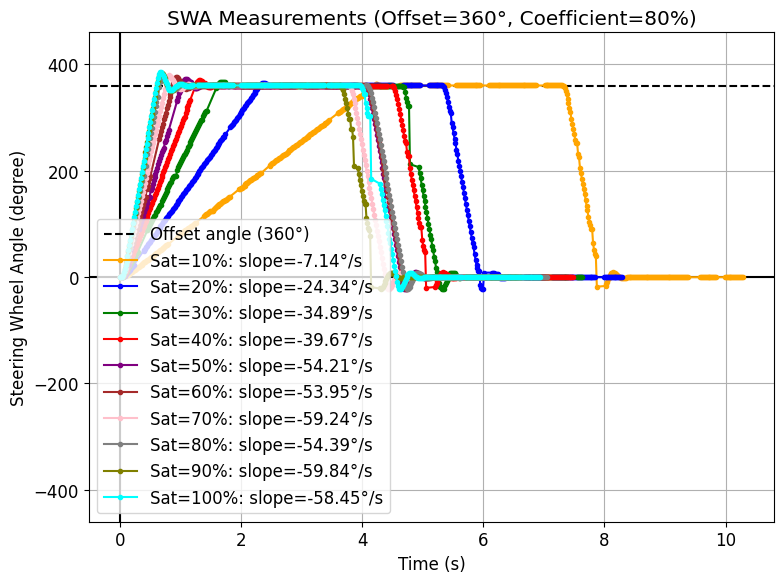

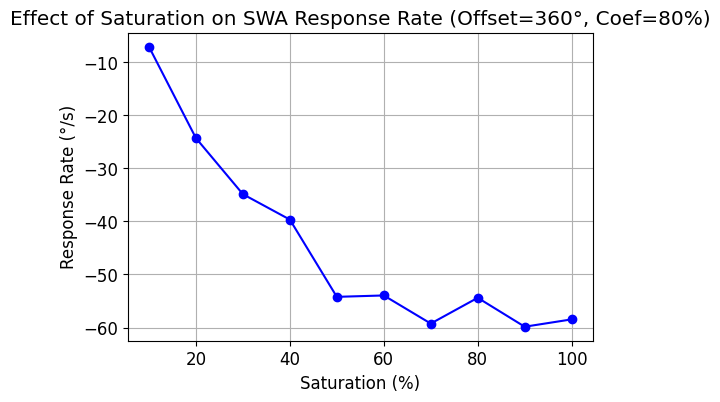

In [55]:
from scipy.stats import linregress
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8, 6))
plt.rcParams.update({'font.size': 12})
colors = ['orange', 'blue', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

offset = 360
coef = 80

# Plot a horizontal line for the offset angle
plt.axhline(y=offset, color='black', linestyle='--', label=f'Offset angle ({offset}°)')
plt.axhline(y=0, color='black', linestyle='-')
plt.axvline(x=0, color='black', linestyle='-')

# Create a list to store slopes for different saturation values
slopes = []

# Plot each saturation value
for k, sat in enumerate(df['Saturation'].unique()):
    df_sub = df[(df['Offset Angle'] == float(offset)) 
                & (df['Coefficient'] == int(coef)) 
                & (df['Saturation'] == int(sat))]
        
    if len(df_sub) > 0:
        # Normalize timestamp to start from 0
        df_sub = df_sub.copy()  # Create a copy to avoid SettingWithCopyWarning
        df_sub["timestamp"] = df_sub["timestamp"].astype(float) - float(df_sub["timestamp"].iloc[0])
        
        # Calculate slope using linregress between time and SWA
        x = df_sub['timestamp'].values
        y = df_sub["SWA (Measured)"].values
        slope, intercept = np.polyfit(x, y, 1)
        slopes.append((sat, slope))
        
        plt.plot(df_sub['timestamp'], df_sub["SWA (Measured)"],
                marker='.', color=colors[k % len(colors)], 
                label=f'Sat={sat}%: slope={slope:.2f}°/s')
    
plt.xlabel("Time (s)")
plt.ylabel("Steering Wheel Angle (degree)")
plt.ylim(-460, 460)
plt.title(f"SWA Measurements (Offset={offset}°, Coefficient={coef}%)")
plt.tight_layout()
plt.legend(loc='best')
plt.grid(True)

# Optional: Add a small subplot showing the relationship between saturation and slope
if len(slopes) > 1:
    plt.figure(figsize=(6, 4))
    sat_values = [s[0] for s in slopes]
    slope_values = [s[1] for s in slopes]
    plt.plot(sat_values, slope_values, 'o-', color='blue')
    plt.xlabel('Saturation (%)')
    plt.ylabel('Response Rate (°/s)')
    plt.title(f'Effect of Saturation on SWA Response Rate (Offset={offset}°, Coef={coef}%)')
    plt.grid(True)

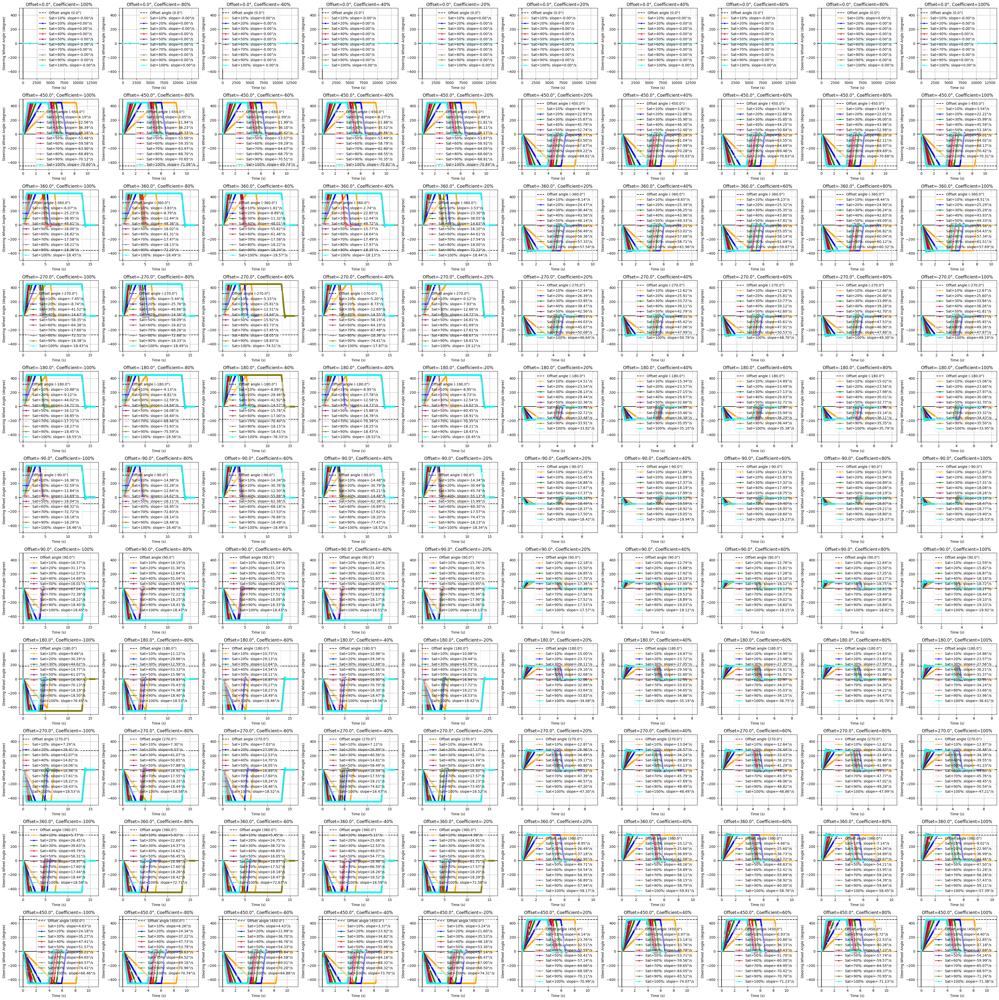

In [56]:
from scipy.stats import linregress

plt.figure(figsize=(40, 40))
plt.rcParams.update({'font.size': 10})
colors = ['orange', 'blue', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

n_col = len(df['Coefficient'].unique())
n_row = len(df['Offset Angle'].unique())

for i, offset in enumerate(df['Offset Angle'].unique()):
    for j, coef in enumerate(df['Coefficient'].unique()):
        plt.subplot(n_row, n_col, i * n_col + j + 1)

        # Plot a horizontal line for the offset angle
        plt.axhline(y=offset, color='black', linestyle='--', label=f'Offset angle ({offset}°)')
        plt.axhline(y=0, color='black', linestyle='-')
        plt.axvline(x=0, color='black', linestyle='-')

        # Plot each saturation value
        for k, sat in enumerate(df['Saturation'].unique()):
            df_sub = df[(df['Offset Angle'] == float(offset)) 
                        & (df['Coefficient'] == int(coef)) 
                        & (df['Saturation'] == int(sat))]
                
            if len(df_sub) > 0:
                # Normalize timestamp to start from 0
                df_sub = df_sub.copy()  # Create a copy to avoid SettingWithCopyWarning
                df_sub["timestamp"] = df_sub["timestamp"].astype(float) - float(df_sub["timestamp"].iloc[0])
                
                # Calculate slope using linregress between time and SWA
                x = df_sub['timestamp'].values
                y = df_sub["SWA (Measured)"].values
                slope, intercept = np.polyfit(x, y, 1)
                
                plt.plot(df_sub['timestamp'], df_sub["SWA (Measured)"],
                        marker='.', color=colors[k % len(colors)], 
                        label=f'Sat={sat}%: slope={slope:.2f}°/s')
            
        plt.xlabel("Time (s)")
        plt.ylabel("Steering Wheel Angle (degree)")
        plt.ylim(-500, 500)
        plt.title(f"Offset={offset}°, Coefficient={coef}%")
        plt.tight_layout()
        plt.legend(loc='best', fancybox=True, framealpha=0.5)
        plt.grid(True)


# plt.tight_layout()
plt.show()
plt.close()

In [70]:
def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

C:\Users\phuongnam-d\AppData\Local\Temp\ipykernel_28368\384772607.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sub["timestamp"] = df_sub["timestamp"] - df_sub["timestamp"].iloc[0]


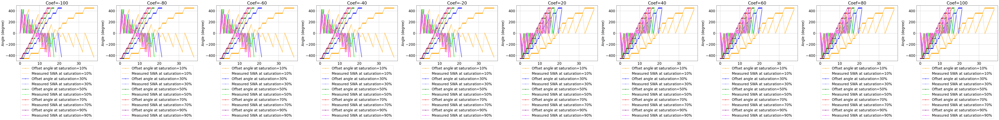

In [89]:
plt.figure(figsize=(80, 10))
plt.rcParams.update({'font.size': 20})

n_row = len(df['Saturation'].unique())
n_col = len(df['Coefficient'].unique())

colors = ['orange', 'blue', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

for j, coef in enumerate(df['Coefficient'].unique()):
    plt.subplot(1, n_col, j + 1)
    for i, sat in enumerate(df['Saturation'].unique()):
        df_sub = df[(df['Saturation'] == sat) & (df['Coefficient'] == coef)]
        df_sub["timestamp"] = df_sub["timestamp"] - df_sub["timestamp"].iloc[0]
        
        plt.plot(df_sub['timestamp'], df_sub["Offset Angle"], 
                 color=colors[i], marker='.', label=f'Offset angle at saturation={sat}%')
        
        plt.plot(df_sub['timestamp'], df_sub["SWA (Measured)"],
                 color=lighten_color(colors[i], 0.5), marker='.', label=f'Measured SWA at saturation={sat}%')
        
        plt.xlabel("Time (s)")
        plt.ylabel("Angle (degree)")
        plt.title(f"Coef={coef}")
        plt.tight_layout()
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),  fancybox=True, ncol=1)
        plt.grid()
        

# plt.tight_layout()

plt.show()
plt.close()

C:\Users\phuongnam-d\AppData\Local\Temp\ipykernel_28368\1343865490.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sub["timestamp"] = df_sub["timestamp"] - df_sub["timestamp"].iloc[0]


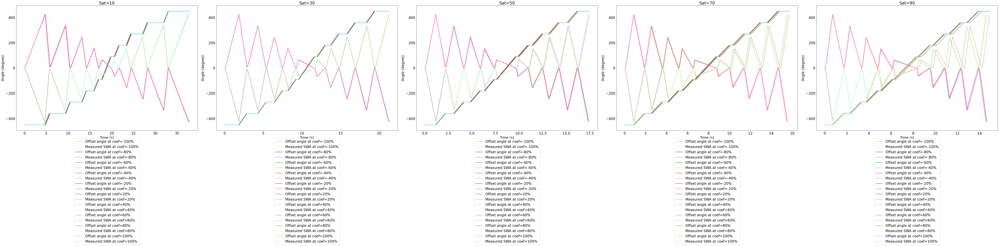

In [79]:
plt.figure(figsize=(80, 20))
plt.rcParams.update({'font.size': 20})

n_col = len(df['Saturation'].unique())
n_row = len(df['Coefficient'].unique())

colors = ['orange', 'blue', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

for i, sat in enumerate(df['Saturation'].unique()):
    plt.subplot(1, n_col, i + 1)
    for j, coef in enumerate(df['Coefficient'].unique()):
        df_sub = df[(df['Saturation'] == sat) & (df['Coefficient'] == coef)]
        df_sub["timestamp"] = df_sub["timestamp"] - df_sub["timestamp"].iloc[0]
        
        plt.plot(df_sub['timestamp'], df_sub["Offset Angle"], 
                 color=colors[j], label=f'Offset angle at coef={coef}%')
        
        plt.plot(df_sub['timestamp'], df_sub["SWA (Measured)"],
                 color=lighten_color(colors[j], 0.5), label=f'Measured SWA at coef={coef}%')
        
        plt.xlabel("Time (s)")
        plt.ylabel("Angle (degree)")
        plt.title(f"Sat={sat}")
        plt.tight_layout()
        plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),  fancybox=True, ncol=1)
        plt.grid()
        

# plt.tight_layout()

plt.show()
plt.close()

## Plots the relationship between measured data
1. Input: (logitech) steering wheel angle offset ~ Measured: (logitech) steering wheel angle
2. Input: (logitech) steering wheel angle ~ Measured: (carla) steering input
3. Input: (carla) steering input ~ Measured: (carla) steering angle 
4. Input: (carla) steering angle ~ Measured: change of yaw angles (vehicle angle)

Linear Relation: Y = 5.071472 * X + -43.396379


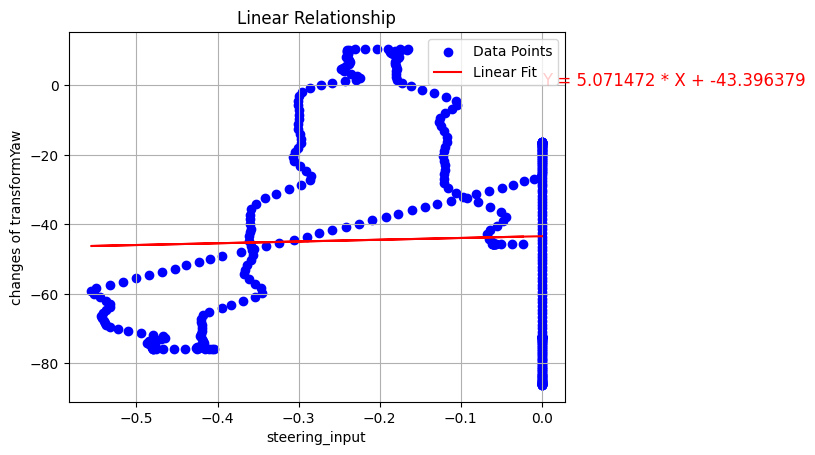

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

df = pd.read_excel('./data/vehicle_logs/forward_2.xlsx')
# df = df.iloc[410:410+42*30]
# df = df.iloc[310:310+42*30]

# Extract X and Y
X = df[['LocationX']]  # Feature must be 2D
Y = df['LocationY']  # Target can be 1D
# Linear Regression Model
model = LinearRegression()
model.fit(X, Y)

# Coefficient and Intercept
slope = model.coef_[0]
intercept = model.intercept_

print(f"Linear Relation: Y = {slope:.6f} * X + {intercept:.6f}")

# Predicted Y values
Y_pred = model.predict(X)

# Plot the data and linear fit
# show equation on the plot

plt.scatter(X, Y, color='blue', label='Data Points')
plt.plot(X, Y_pred, color='red', label='Linear Fit')
plt.text(0, 0, f'Y = {slope:.6f} * X + {intercept:.6f}', fontsize=14, color='red')
plt.xlabel('steering_input')
plt.ylabel('changes of transformYaw')
plt.title('Linear Relationship')
plt.legend()
plt.grid(True)
plt.show()


## Plot the path from trial files

Mean P_0=  [ -2.28414266 -31.76363449] std:  [0.69571586 1.59066774]
Mean P_d=  [  1.3190975  -17.71419983] std:  [1.28412121 0.94453664]
Mean P_f=  [ -7.52827587 -21.45773392] std:  [0.24394655 0.18573103]
Mean yaw_0=  1.0251007000000016 std:  3.025966799170614
Mean yaw_d=  51.23525617400001 std:  9.297417441007045
Mean yaw_f=  91.296984836 std:  0.7554986672489944


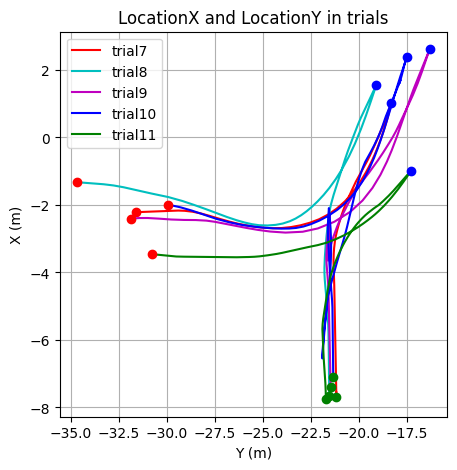

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('default')

colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']

plt.figure(figsize=(5,5))
plt.title('LocationX and LocationY in trials')

backward_range = range(0, 6)
forward_range = range(7, 12)

range_ = forward_range

paths = {}
P_0 = []
P_d = []
P_f = []
yaw_0 = []
yaw_d = []
yaw_f = []

for i in range_:
    df = pd.read_excel(f'../data/trials/trial{i + 1}.xlsx')
    x = df['LocationX'].to_list()
    y = df['LocationY'].to_list()
    yaw = df['RotationYaw'].to_list()
    
    paths[f'trial{i}'] = [(x_t, y_t) for x_t, y_t in zip(x, y)]
    
    P_0.append([x[0], y[0]])
    P_d.append([max(x), y[x.index(max(x))]])
    P_f.append([min(x), y[x.index(min(x))]])
    yaw_0.append(90 - yaw[0])
    yaw_d.append(90 - yaw[x.index(max(x))])
    yaw_f.append(90 - yaw[x.index(min(x))])
        
    plt.plot(y, x, color=colors[i%len(range_)], label=f'trial{i}')
    plt.plot(y[0], x[0], 'ro')
    plt.plot(y[x.index(min(x))], min(x), 'go')
    plt.plot(y[x.index(max(x))], max(x), 'bo') # turning point
    
P_0 = np.array(P_0)
P_d = np.array(P_d)
P_f = np.array(P_f)
yaw_0 = np.array(yaw_0)
yaw_d = np.array(yaw_d)
yaw_f = np.array(yaw_f)

print("Mean P_0= ", np.mean(P_0, axis=0), "std: ", np.std(P_0, axis=0))
print("Mean P_d= ", np.mean(P_d, axis=0), "std: ", np.std(P_d, axis=0))
print("Mean P_f= ", np.mean(P_f, axis=0), "std: ", np.std(P_f, axis=0))
print("Mean yaw_0= ", np.mean(yaw_0), "std: ", np.std(yaw_0))
print("Mean yaw_d= ", np.mean(yaw_d), "std: ", np.std(yaw_d))
print("Mean yaw_f= ", np.mean(yaw_f), "std: ", np.std(yaw_f))
    
plt.xlabel('Y (m)')
plt.ylabel('X (m)')

plt.legend()

plt.grid()
plt.show()
plt.close()

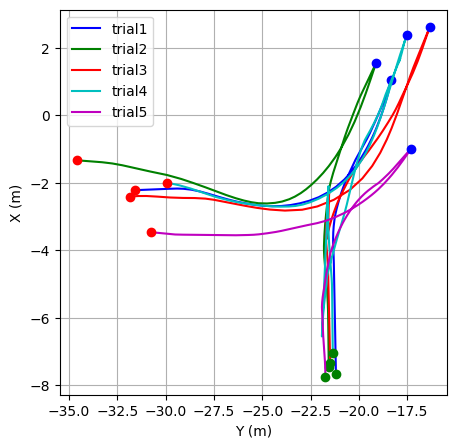

In [4]:
# preprocess paths, remove outliers,and duplicate points
from os import path
from scipy import interpolate
import numpy as np
import pandas as pd

path_data = {}

for i in range_:
    df = pd.read_excel(f'../data/trials/trial{i + 1}.xlsx')
    X = df['LocationX']
    Y = df['LocationY']
   
    P_0 = [X[0], Y[0]]
    P_d = [max(X), Y[X.idxmax()]]
    P_f = [min(X), Y[X.idxmin()]]
    
    for j in range(1, X.idxmax()):
        changes_x = X.diff().fillna(0)[j]
        changes_y = Y.diff().fillna(0)[j]

        if (-1 if range_ == backward_range else 1) * changes_y > 0 and abs(changes_y) > 1e-3:
            path_data.setdefault(f'trial{i + 1}', []).append([X[j], Y[j]])
    
    for j in range(X.idxmax(), X.idxmin()):
        changes_x = X.diff().fillna(0)[j]
        changes_y = Y.diff().fillna(0)[j]
        
        if  changes_x < 0 and abs(changes_x) > 1e-3:
            path_data.setdefault(f'trial{i + 1}', []).append([X[j], Y[j]]) 

plt.figure(figsize=(5,5))
for i in range(len(path_data)):
    path = np.array(path_data[f'trial{i + 1 + list(range_)[0]}'])
    # path = np.unique(path, axis=0)
    x, y = path[:, 0], path[:, 1]
    plt.plot(y, x, color=colors[i], label=f'trial{i + 1}')
    plt.plot(y[0], x[0], 'ro')
    plt.plot(y[np.argmin(x)], min(x), 'go')
    plt.plot(y[np.argmax(x)], max(x), 'bo') 
    
    
plt.xlabel('Y (m)')
plt.ylabel('X (m)')

plt.legend()

plt.grid()
plt.show()
plt.close()

(142, 2)
46 141
Mean P_0=  [-2.284308814, -31.734065629999996]
Mean P_d=  [0.409550333177305, -18.459612079588652]
Mean P_f=  [-7.449310874, -21.459648512]


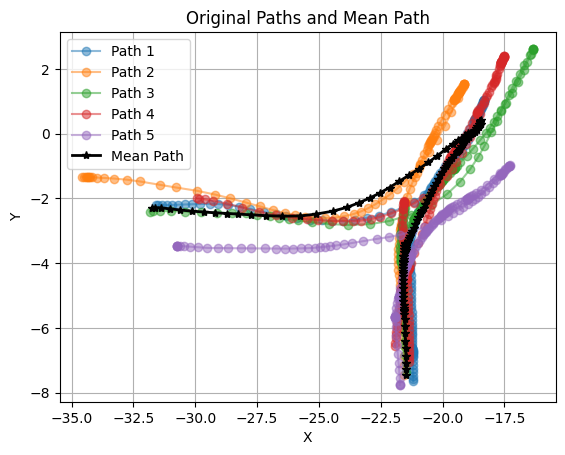

In [ ]:

def resample_path(path, num_points):
    """Resample a path to a specified number of points using linear interpolation."""
    # Separate x and y coordinates
    x = np.array([p[0] for p in path])
    y = np.array([p[1] for p in path])
    
    # Create interpolation functions
    t = np.linspace(0, 1, len(path))  # Parameterize original points
    t_new = np.linspace(0, 1, num_points)  # New parameterization
    
    # Interpolate x and y separately
    fx = interpolate.interp1d(t, x, kind='linear')
    fy = interpolate.interp1d(t, y, kind='linear')
    
    x_new = fx(t_new)
    y_new = fy(t_new)
    
    return list(zip(x_new, y_new))

def compute_mean_path(paths, num_points=None):
    """Compute the mean path by resampling all paths and averaging."""
    if num_points is None:
        # Use the length of the longest path by default
        num_points = min(len(path) for path in paths)
    
    # Resample all paths to the same number of points
    resampled_paths = [resample_path(path, num_points) for path in paths]
    
    # Convert to numpy array for easier averaging
    resampled_array = np.array(resampled_paths)  # Shape: (n_paths, num_points, 2)
    
    # Compute mean across paths (axis 0)
    mean_path = np.mean(resampled_array, axis=0)  # Shape: (num_points, 2)
    
    return mean_path

def plot_paths(original_paths, mean_path):
    """Plot original paths and the mean path."""
    plt.figure()
    
    # Plot original paths
    for i, path in enumerate(original_paths):
        x, y = zip(*path)
        plt.plot(y, x, 'o-', label=f'Path {i+1}', alpha=0.5)
    
    # Plot mean path
    x_mean, y_mean = zip(*mean_path)
    P_0 = [x_mean[0], y_mean[0]]
    P_d = [max(x_mean), y_mean[np.argmax(x_mean)]]
    P_f = [min(x_mean), y_mean[np.argmin(x_mean)]]
    print(np.argmax(x_mean), np.argmin(x_mean))
    print("Mean P_0= ", P_0)
    print("Mean P_d= ", P_d)
    print("Mean P_f= ", P_f)
    plt.plot(y_mean, x_mean, 'k*-', label='Mean Path', linewidth=2)
    
    plt.legend()
    plt.xlabel('Y')
    plt.ylabel('X')
    plt.title('Original Paths and Mean Path')
    plt.grid(True)
    plt.show()
    
# Compute the mean path
mean_path = compute_mean_path(path_data.values())
print(mean_path.shape)
# Display results
with open('../data/paths/driving_path_right2left.txt', 'w') as f:
    for point in mean_path:
        f.write(f"{point[0]},{point[1]}\n")

# Visualize
plot_paths(path_data.values(), mean_path)

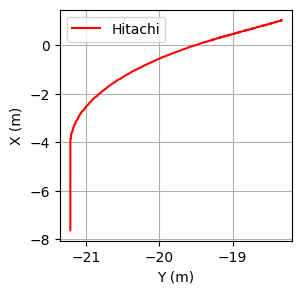

In [11]:
with open('../PythonAPI/data/paths/hitachi.txt', 'r') as f:
    lines = f.readlines()
    hitachi_path = []
    for line in lines:
        x, y = line.strip().split(',')
        hitachi_path.append([float(x), float(y)])
    hitachi_path = np.array(hitachi_path)

plt.figure(figsize=(3, 3))
x, y = hitachi_path[:, 0], hitachi_path[:, 1]
plt.plot(y, x, 'r', label='Hitachi')
# plt.plot(y[0], x[0], 'ro')
# plt.plot(y[np.argmin(x)], min(x), 'go')
# plt.plot(y[np.argmax(x)], max(x), 'bo')
plt.xlabel('Y (m)')
plt.ylabel('X (m)')
plt.legend()
plt.grid()
plt.show()
plt.close()

In [ ]:
import numpy as np

def compute_tangents(points):
    tangents = []
    n = len(points)

    for i in range(n):
        if i == 0:
            dx, dy = points[i + 1][0] - points[i][0], points[i + 1][1] - points[i][1]
        elif i == n - 1:
            dx, dy = points[i][0] - points[i - 1][0], points[i][1] - points[i - 1][1]
        else:
            dx, dy = points[i + 1][0] - points[i - 1][0], points[i + 1][1] - points[i - 1][1]

        scale = 1
        p1 = (points[i][0] - scale * dx, points[i][1] - scale * dy)
        p2 = (points[i][0] + scale * dx, points[i][1] + scale * dy)

        tangents.append((p1, p2))

    return tangents

def process_exist_path(path):
    """
    Process an existing path consisting of a series of points and compute
    tangent vectors at each point along the path.

    Args:
        path: A list or numpy array of [x,y] coordinates that form a path

    Returns:
        param: Dictionary containing the original path and computed tangent vectors
    """
    path = np.array(path)
    param = {
        "path": path,
        "start_x": path[0][0],
        "start_y": path[0][1],
        "end_x": path[-1][0],
        "end_y": path[-1][1],
        "tangent": compute_tangents(path),
    }

    return param

with open("../data/paths/driving_path_left2right.txt", "r") as f:
    data_left2right = f.readlines()
    data_left2right = [line.strip().split(",") for line in data_left2right]
    data_left2right = [[float(val) for val in line] for line in data_left2right]
    data_left2right = np.array(data_left2right)

with open("../data/paths/driving_path_right2left.txt", "r") as f:
    data_right2left = f.readlines()
    data_right2left = [line.strip().split(",") for line in data_right2left]
    data_right2left = [[float(val) for val in line] for line in data_right2left]
    data_right2left = np.array(data_right2left)

with open("../data/paths/hitachi.txt", "r") as f:
    data_hitachi = f.readlines()
    data_hitachi = [line.strip().split(",") for line in data_hitachi]
    data_hitachi = [[float(val) for val in line] for line in data_hitachi]
    data_hitachi = np.array(data_hitachi)



predefined_path = {
    "0": {
        "P_0": [-1.47066772, -13.22415039],
        "P_d": [-0.37066772, -29.02415039],
        "P_f": [-6.87066772, -21.62415039],
        "yaw_0": 90 - (-90),
        "yaw_d": 90 - (-80),
        "yaw_f": 90 - 0,
        "forward paths": None,
        "backward paths": None,
    },
    "1": {
        "P_0": [-2.376371583333333, -13.749357381666668],
        "P_d": [-0.566469992644628, -27.297582133636364],
        "P_f": [-7.7486732, -21.271947543333333],
        "yaw_0": 90 - (88.97628786666667),
        "yaw_d": 90 - (62.168829599999995),
        "yaw_f": 90 - (-1.9554259149999922),
        "forward paths": process_exist_path(data_left2right[:40]),
        "backward paths": process_exist_path(data_left2right[40:]),
    },
    "2": {
        "P_0": [-2.284308814, -31.734065629999996],
        "P_d": [0.409550333177305, -18.459612079588652],
        "P_f": [-7.449310874, -21.459648512],
        "yaw_0": 90 - (-88.9748993),
        "yaw_d": 90 - (-38.76474382600003),
        "yaw_f": 90 - (1.296984835999993),
        "forward paths": process_exist_path(data_right2left[:46]),
        "backward paths": process_exist_path(data_right2left[46:]),
    },
    "3": {
        "P_0": [],
        "P_d": [1.035116, -18.325821],
        "P_f": [-7.685114, -21.214608],
        "yaw_0": None,
        "yaw_d": 90 - (50),
        "yaw_f": 90 - (0),
        "forward paths": [],
        "backward paths": process_exist_path(data_hitachi),
    },
}
# predefined_path["1"]["forward paths"]

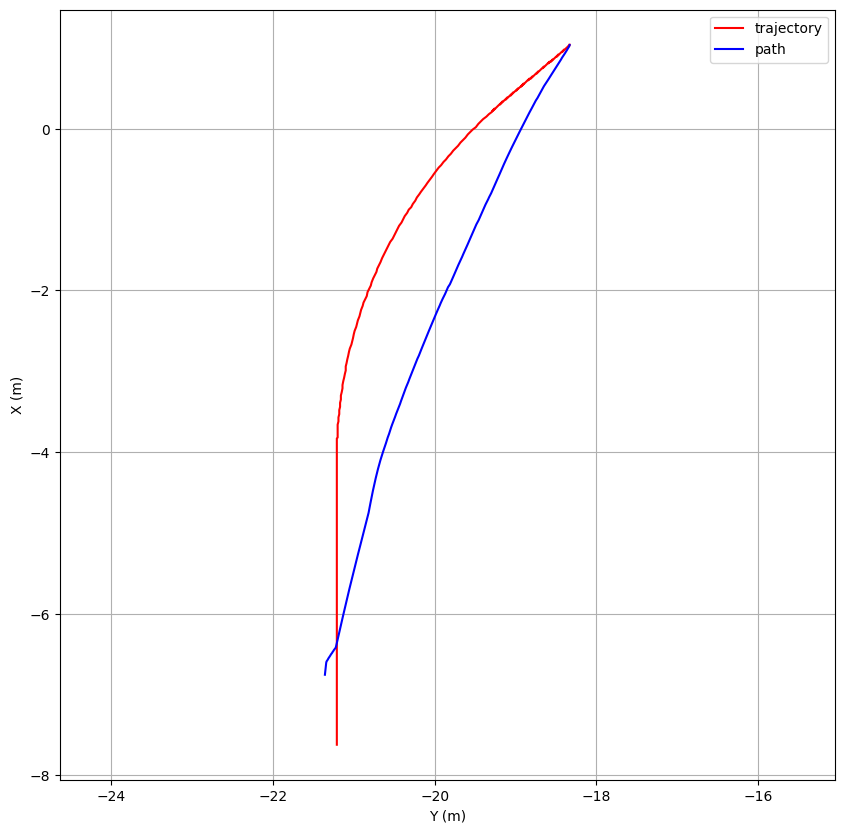

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

plt.style.use('default')

df = pd.read_csv("./logs/haptic_shared_control_log_2025-03-11_16-32-46.csv")
data = df[["[Measured] Current Position ~ r(t) (m)_X", 
           "[Measured] Current Position ~ r(t) (m)_Y", 
           "[Measured] Current Yaw Angle ~ Phi(t) (deg)"]].to_numpy()
        

# plot the path and the trajectory
plt.figure()
trajectory = predefined_path["3"]["backward paths"]["path"]
plt.plot(trajectory[:, 1], trajectory[:, 0], 'r', label='trajectory')
plt.plot(data[:, 1], data[:, 0], 'b', label='path')
# for i, (x, y) in enumerate(zip(data[:, 1], data[:, 0])):
#     plt.arrow(x, y, 
#         0.03 * np.cos(np.radians(90 - data[:, 2][i])), 
#         0.03 * np.sin(np.radians(90 - data[:, 2][i])), 
#         head_width=0.1, head_length=0.1, fc='red', ec='red')
plt.xlabel('Y (m)')
plt.ylabel('X (m)')
plt.legend()
plt.axis('equal')
plt.grid()
plt.show()
plt.close()
    

## Plot driving results

In [4]:
"""
['Time (t)', '[Measured] Current Position ~ r(t) (m)_X',
       '[Measured] Current Position ~ r(t) (m)_Y',
       '[Measured] Steering Angles ~ delta(t) (deg)_FL',
       '[Measured] Steering Angles ~ delta(t) (deg)_FR',
       '[Measured] Current Yaw Angle ~ Phi(t) (deg)',
       '[Measured] Steering Wheel Angle ~ Theta(t) (deg)',
       '[Computed] Rotation direction ~ (CW/CCW)',
       '[Computed] Turning Radius ~ R(delta) (m)',
       '[Computed] Vehicle Steering Angle ~ Delta(t) (deg)',
       '[Computed] Center of Rotation to WORLD ~ r_c(t) (m)_X',
       '[Computed] Center of Rotation to WORLD ~ r_c(t) (m)_Y',
       '[Computed] Current Error to Trajectory ~ e(t)',
       '[Computed] Predicted Position ~ r_tp(t) (m)_X',
       '[Computed] Predicted Position ~ r_tp(t) (m)_Y',
       '[Computed] Change of Yaw Angle ~ Delta_phi(t) (deg)',
       '[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)',
       '[Computed] Predicted Error to Trajectory ~ eps_tp(t)',
       '[Computed] Desired Steering Wheel Angle ~ Theta_d(t) (deg)',
       '[Computed] Torque applied ~ Tau_das (N.m)']
"""

"\n['Time (t)', '[Measured] Current Position ~ r(t) (m)_X',\n       '[Measured] Current Position ~ r(t) (m)_Y',\n       '[Measured] Steering Angles ~ delta(t) (deg)_FL',\n       '[Measured] Steering Angles ~ delta(t) (deg)_FR',\n       '[Measured] Current Yaw Angle ~ Phi(t) (deg)',\n       '[Measured] Steering Wheel Angle ~ Theta(t) (deg)',\n       '[Computed] Rotation direction ~ (CW/CCW)',\n       '[Computed] Turning Radius ~ R(delta) (m)',\n       '[Computed] Vehicle Steering Angle ~ Delta(t) (deg)',\n       '[Computed] Center of Rotation to WORLD ~ r_c(t) (m)_X',\n       '[Computed] Center of Rotation to WORLD ~ r_c(t) (m)_Y',\n       '[Computed] Current Error to Trajectory ~ e(t)',\n       '[Computed] Predicted Position ~ r_tp(t) (m)_X',\n       '[Computed] Predicted Position ~ r_tp(t) (m)_Y',\n       '[Computed] Change of Yaw Angle ~ Delta_phi(t) (deg)',\n       '[Computed] Predicted Yaw Angle ~ Phi_tp(t) (deg)',\n       '[Computed] Predicted Error to Trajectory ~ eps_tp(t)',\n  

In [ ]:
from pprint import pp
import pandas as pd
df = pd.read_csv("./logs/haptic_shared_control_log_2025-03-11_16-32-46.csv")

df['Time (t)'] = df['Time (t)'] - df['Time (t)'][0]
df["Velocity x"] = df["X (m)"].diff().fillna(0) / df["Time"].diff().fillna(0)
df["Velocity y"] = df["Y (m)"].diff().fillna(0) / df["Time"].diff().fillna(0)
df["Velocity"] = np.sqrt(df["Velocity x"] ** 2 + df["Velocity y"] **2) * (np.deg2rad(df["Change of Yaw Angle (degree)"]) / (df["Rotate"])) / np.abs((np.deg2rad(df["Change of Yaw Angle (degree)"]) / (df["Rotate"])))
df.head()

,Time,X (m),Y (m),FL_angle (degree),FR_angle (degree),Yaw Angle (degree),Steering Wheel Angle (degree),Turning Radius (m),Vehicle Steering Angle (degree),Center of Rotation to WORLD X (m),...,Predicted Position Y (m),Change of Yaw Angle (degree),Predicted Yaw Angle (degree),Predicted Error to Trajectory (m),Desired Steering Wheel Angle (degree),Torque applied (N.m),Rotate,Velocity x,Velocity y,Velocity
0,0.000000,-2.379271,-21.964331,29.931215,40.225269,51.835308,450.0,5.390966,14.525250,3.267616,...,-4.230747,-53.296287,105.131595,-16.025827,-12820.339570,-112.997813,1.0,NaN,NaN,NaN
1,0.047656,-2.337891,-21.855639,29.905725,40.184902,53.273628,450.0,5.396168,14.510941,3.378520,...,-3.910543,-54.393441,107.667069,-16.359083,-13096.052649,-103.929806,1.0,0.868294,2.280763,-2.440453
2,0.097279,-2.297540,-21.740858,29.900719,40.178574,54.777737,450.0,5.397191,14.508131,3.488664,...,-3.656026,-54.641903,109.419640,-16.630465,-13320.320347,-93.452175,1.0,0.813159,2.313048,-2.451820
3,0.142324,-2.266965,-21.646688,29.905962,40.188694,56.002010,450.0,5.396120,14.511073,3.574938,...,-3.488208,-54.399791,110.401801,-16.814556,-13472.311765,-84.659054,1.0,0.678752,2.090572,-2.197998
4,0.186377,-2.233272,-21.533649,29.918350,40.210232,57.461803,450.0,5.393591,14.518027,3.674547,...,-3.313412,-53.815529,111.277332,-17.010244,-13633.767727,-73.674923,1.0,0.764829,2.565973,-2.677533


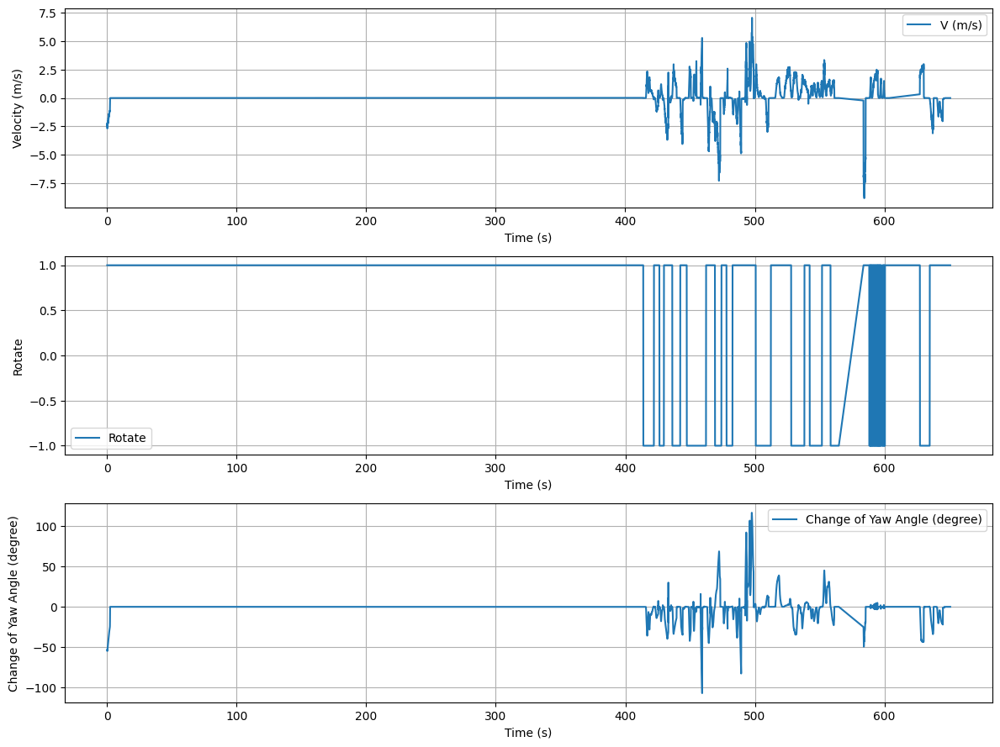

In [38]:
# plot velocity, rotate, and change of yaw angle
plt.figure(figsize=(12, 9))
plt.subplot(311)
plt.plot(df["Time"], df["Velocity"], label='V (m/s)')
plt.xlabel('Time (s)')
plt.ylabel('Velocity (m/s)')
plt.grid()
plt.legend()

plt.subplot(312)
plt.plot(df["Time"], df["Rotate"], label='Rotate')
plt.xlabel('Time (s)')
plt.ylabel('Rotate')
plt.grid()
plt.legend()

plt.subplot(313)
plt.plot(df["Time"], df["Change of Yaw Angle (degree)"], label='Change of Yaw Angle (degree)')
plt.xlabel('Time (s)')
plt.ylabel('Change of Yaw Angle (degree)')
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()
plt.close()



# **Bezier curve**



In [5]:
# load from json
import json
from pprint import pprint
import numpy as np
with open('./HapticSharedControl/wheel_setting.json', 'r') as f:
    Wheel_setting = json.load(f)
# pprint(Wheel_setting)
L = abs(Wheel_setting['wheels'][0]['position']['y'] - Wheel_setting['wheels'][2]['position']['y']) / 100
T = abs(Wheel_setting['wheels'][0]['position']['x'] - Wheel_setting['wheels'][1]['position']['x']) / 100
theta1 = np.radians(69.99)
theta2 = np.radians(47.95)

R = (L/np.sin(theta2) + np.sqrt((L/np.tan(theta1) + T)**2 + L**2))/2
R, L, T

(4.06345498866564, 3.00464477, 1.66682792)

In [9]:
from HapticSharedControl.path_planning import *
import matplotlib.pyplot as plt
plt.style.use('default')

P_0 = [-1.47066772, -13.22415039] # [y, x]
P_f = [-6.87066772, -21.62415039]
P_d = [-0.37066772 , -29.02415039]

yaw_0 = 0
yaw_d = 10
yaw_f = 90

vel = 2.0 # km/h

# #plot points
# plt.figure()

# plt.plot(P_0[1], P_0[0], 'go')
# plt.plot(P_d[1], P_d[0], 'bo')
# plt.plot(P_f[1], P_f[0], 'ro')
# plt.grid()

# plt.show()

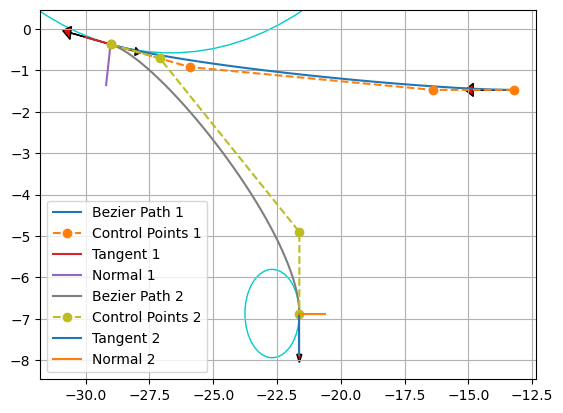

In [11]:
n_points = 100
path1, control_points1, params1 = calculate_bezier_trajectory(
    start_pos=P_0[::-1],
    end_pos=P_d[::-1],
    start_yaw=yaw_0,
    end_yaw=yaw_d,
    n_points=n_points,
    turning_radius=R,
    show_animation=False,
)
# backward so reverse the yaw angle (+180)
path2, control_points2, params2 = calculate_bezier_trajectory(
    start_pos=P_d[::-1],
    end_pos=P_f[::-1],
    start_yaw=180 + yaw_d,
    end_yaw=180 + yaw_f,
    n_points=n_points,
    turning_radius=R,
    show_animation=False,
)

# show 2 path in same plot
plt.figure()
plt.plot(path1.T[0], path1.T[1], label="Bezier Path 1")
plt.plot(control_points1.T[0], control_points1.T[1], "--o", label="Control Points 1")
plt.plot(params1["x_target"], params1["y_target"])
plt.plot(params1["tangent"][-1][:, 0], params1["tangent"][-1][:, 1], label="Tangent 1")
plt.plot(params1["normal"][-1][:, 0], params1["normal"][-1][:, 1], label="Normal 1")
plt.gca().add_artist(params1["circle"])
plot_arrow(
    params1["start_x"],
    params1["start_y"],
    np.pi - params1["start_yaw"],
    length=0.1 * params1["dist"],
    width=0.02 * params1["dist"],
)
plot_arrow(
    params1["end_x"],
    params1["end_y"],
    np.pi - params1["end_yaw"],
    length=0.1 * params1["dist"],
    width=0.02 * params1["dist"],
)

plt.plot(path2.T[0], path2.T[1], label="Bezier Path 2")
plt.plot(control_points2.T[0], control_points2.T[1], "--o", label="Control Points 2")
plt.plot(params2["x_target"], params2["y_target"])
plt.plot(params2["tangent"][-1][:, 0], params2["tangent"][-1][:, 1], label="Tangent 2")
plt.plot(params2["normal"][-1][:, 0], params2["normal"][-1][:, 1], label="Normal 2")
plt.gca().add_artist(params2["circle"])
plot_arrow(
    params2["start_x"],
    params2["start_y"],
    np.pi - params2["start_yaw"],
    length=0.1 * params2["dist"],
    width=0.02 * params2["dist"],
)
plot_arrow(
    params2["end_x"],
    params2["end_y"],
    np.pi - params2["end_yaw"],
    length=0.1 * params2["dist"],
    width=0.02 * params2["dist"],
)

plt.legend()
plt.grid(True)
plt.show()
plt.axis('square')
plt.close()

# Haptic shared control

In [20]:
from HapticSharedControl.utils import *
from HapticSharedControl.haptic_algo import *
from HapticSharedControl.path_planning import *

# load from json
import json
from pprint import pprint
import numpy as np
with open('./HapticSharedControl/wheel_setting.json', 'r') as f:
    Wheel_setting = json.load(f)
# pprint(Wheel_setting)
L = abs(Wheel_setting['wheels'][0]['position']['y'] - Wheel_setting['wheels'][2]['position']['y']) / 100
T = abs(Wheel_setting['wheels'][0]['position']['x'] - Wheel_setting['wheels'][1]['position']['x']) / 100
theta1 = np.radians(69.99)
theta2 = np.radians(47.95)

R = (L/np.sin(theta2) + np.sqrt((L/np.tan(theta1) + T)**2 + L**2))/2
R, L, T

(4.06345498866564, 3.00464477, 1.66682792)

In [21]:

import matplotlib.pyplot as plt

P_d = [-0.37066772 , -29.02415039]
P_f = [-6.87066772, -21.62415039]

yaw_d = 10
yaw_f = 90

n_points = 20
# backward so reverse the yaw angle (+180)
path2, control_points2, params2 = calculate_bezier_trajectory(
    start_pos=P_d[::-1],
    end_pos=P_f[::-1],
    start_yaw=180 + yaw_d,
    end_yaw=180 + yaw_f,
    n_points=n_points,
    turning_radius=R,
    show_animation=False,
)


In [22]:
from scipy.spatial import KDTree

def find_closest_point(given_point, list_of_points, method="KDTree"):
    # Convert list_of_points to a NumPy array for efficient processing
    points = np.array(list_of_points)

    if method == "KDTree":
        # Build a KD-Tree from the points
        tree = KDTree(points)

        # Find the index of the nearest neighbor
        _, nnidx = tree.query(given_point, k=1)
    else:
        # Find the index of the nearest neighbor
        nnidx = np.argmin(np.linalg.norm(points - given_point, axis=1))
    # Return the closest point using the found index
    return list_of_points[nnidx], nnidx

def distance_to_trajectory( position, trajectory):
    # More robust distance calculation by checking multiple points
    min_dist = float("inf")
    closest_point, idx = find_closest_point(position, trajectory)
    return min(dist(position, closest_point), min_dist), closest_point, idx

def get_sign_of_error(speed, position, trajectory_param):

    p1 = position
    _, pt_index = find_closest_point(p1, trajectory_param["path"])

    p2, p3 = trajectory_param["tangent"][pt_index]
    angle_rad = getAngle(p1, p2, p3, degrees=False)

    return (speed / np.abs(speed)) * (np.sin(angle_rad) / abs(np.sin(angle_rad)))


In [33]:
# test predict position
import numpy as np
import math
import matplotlib.pyplot as plt

plt.style.use("default")

def rotation_matrix_cw(angle_rad):
    return np.array(
        [[np.cos(angle_rad), -np.sin(angle_rad)], [np.sin(angle_rad), np.cos(angle_rad)]]
    )

def getAngle(a, b, c, degrees=False):
    angle_rad = math.atan2(c[1] - b[1], c[0] - b[0]) - math.atan2(a[1] - b[1], a[0] - b[0])
    return math.degrees(angle_rad) if degrees else angle_rad

def sign(x):
    return x / np.abs(x) if x != 0 else 0

def predict_position_(current_position, current_yaw_angle_deg, vehicle_steering_angle_deg, vel=2, tp=1):
    wheelbase = 3  # meter
    tire_width = 1.67  # meter
    current_yaw_angle_rad = np.radians(current_yaw_angle_deg)
    vehicle_steering_angle_rad = np.radians(vehicle_steering_angle_deg)

    center_of_mass = 0.45 * wheelbase

    # turning_radius = wheelbase / np.sin(abs(vehicle_steering_angle_rad)) # meter
    turning_radius = np.sqrt(center_of_mass ** 2  + wheelbase ** 2 / np.tan(vehicle_steering_angle_rad) ** 2)
    turning_angle_rad = np.arctan(0.45 * np.tan(vehicle_steering_angle_rad))
    
    print("Turning Radius:", turning_radius)
    # vehicle coordinates, origin at the center of mass
    print(np.sin(current_yaw_angle_rad), np.cos(vehicle_steering_angle_rad))
    rotating_direction = sign(np.sin(turning_angle_rad))
    #  -1 if clockwise, 1 if counter-clockwise
    print("Rotating Direction:", "CW" if rotating_direction == -1 else "CCW")
    
    center_of_rotation_with_vehicle = np.array(
        [
            wheelbase / np.tan(vehicle_steering_angle_rad),
            -center_of_mass,
        ]
    )
    print("[Vehicle] Center of Rotation in Vehicle:", center_of_rotation_with_vehicle.round(3))
    # transform the vehicle coordinates to the global coordinates, rotate and shift
    center_of_rotation_with_world = rotation_matrix_cw(current_yaw_angle_rad - np.pi / 2).dot(
        center_of_rotation_with_vehicle
    ) + np.array(current_position)
    print("[World] Center of Rotation:", center_of_rotation_with_world.round(3))

    # # rotating around the center of rotation
    # rotating_angle_rad = turning_angle_rad - np.pi / 2
    print("Turning Angle:", np.degrees(turning_angle_rad))
    # calculate the predicted position
    delta_phi_rad = - rotating_direction * vel * tp / turning_radius
    # delta_phi_rad = - angular_speed * tp
    delta_phi_deg = np.degrees(delta_phi_rad)
    print("Delta Phi:", delta_phi_deg)
    
    # predict_yaw_angle_deg = current_yaw_angle_deg + delta_phi_deg

    predict_yaw_angle_rad = current_yaw_angle_rad + delta_phi_rad
    predict_yaw_angle_deg = np.degrees(predict_yaw_angle_rad)

    print("Predicted Yaw Angle:", predict_yaw_angle_deg)
    
    predicted_position_in_world = center_of_rotation_with_world + turning_radius * np.array(
        [
            np.cos(predict_yaw_angle_rad - turning_angle_rad + rotating_direction * np.pi/2),
            np.sin(predict_yaw_angle_rad - turning_angle_rad + rotating_direction * np.pi/2),
        ]
    )
    
    print("Predicted Position:", predicted_position_in_world.round(3))
    print("Delta phi (graph):", getAngle(current_position, center_of_rotation_with_world, predicted_position_in_world, degrees=True))
 
    return predicted_position_in_world, center_of_rotation_with_world

In [60]:
with open("../data/paths/hitachi.txt", "r") as f:
    data_hitachi = f.readlines()
    data_hitachi = [line.strip().split(",") for line in data_hitachi]
    data_hitachi = [[float(val) for val in line[::-1]] for line in data_hitachi]
    data_hitachi = np.array(data_hitachi)
    
with open("../data/paths/driving_path_left2right.txt", "r") as f:
    data_left2right = f.readlines()
    data_left2right = [line.strip().split(",") for line in data_left2right]
    data_left2right = [[float(val) for val in line] for line in data_left2right]
    data_left2right = np.array(data_left2right)
    data_left2right = process_exist_path(data_left2right[40:])["path"]
    

In [40]:
def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])

Turning Radius: 5.368659050451984
0.03489949670250114 0.8660254037844387
Rotating Direction: CW
[Vehicle] Center of Rotation in Vehicle: [-5.196 -1.35 ]
[World] Center of Rotation: [ -6.581 -26.512]
Turning Angle: -14.56389115744601
Delta Phi: 10.67227010965776
Predicted Yaw Angle: 188.67227010965775
Predicted Position: [ -8.699 -21.579]
Delta phi (graph): 10.672270109657743
Turning Radius: 5.368659050451984
0.03489949670250114 0.8660254037844387
Rotating Direction: CW
[Vehicle] Center of Rotation in Vehicle: [-5.196 -1.35 ]
[World] Center of Rotation: [ -6.581 -26.512]
Turning Angle: -14.56389115744601
Delta Phi: 21.34454021931552
Predicted Yaw Angle: 199.34454021931552
Predicted Position: [ -9.576 -22.056]
Delta phi (graph): 21.344540219315512
Turning Radius: 5.368659050451984
0.03489949670250114 0.8660254037844387
Rotating Direction: CW
[Vehicle] Center of Rotation in Vehicle: [-5.196 -1.35 ]
[World] Center of Rotation: [ -6.581 -26.512]
Turning Angle: -14.56389115744601
Delta Phi: 

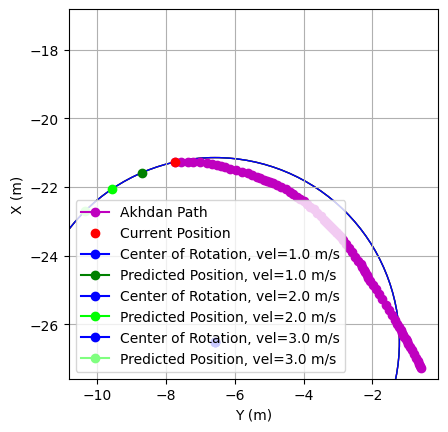

In [ ]:
curr_position = data_left2right[-1]
yaw = 178 # yaw angle to the x axis
steering_angle = -30
vel = 2.0
tp = 1
colors = ["r", "g", "b", "c", "m", "y", "k"]
plt.plot(data_left2right.T[0], data_left2right.T[1], label="Akhdan Path", marker="o", color='m')
plt.plot(curr_position[0], curr_position[1], "ro", label="Current Position")

for i, vel in enumerate([1.0, 2.0, 3.0]):
    position_next, cow = predict_position_(curr_position, yaw, steering_angle, vel=vel, tp=tp)
    # plot curve
    plt.plot(cow[0], cow[1], marker='o', color='b', label=f"Center of Rotation, vel={vel} m/s")
    plt.plot(position_next[0], position_next[1], marker='o', color=lighten_color('g', 1 - i/3) , label=f"Predicted Position, vel={vel} m/s")
    circle = plt.Circle(
        cow, math.hypot(cow[0] - curr_position[0], cow[1] - curr_position[1]), color=colors[i], fill=False
    )
    plt.gca().add_artist(circle)
plt.xlabel("Y (m)")
plt.ylabel("X (m)")
plt.grid()
plt.legend(loc='lower left')
plt.axis("square")
plt.show()
plt.close()